In this assignment, you'll get hands-on experience coding and training Generative Adversarial Networks or GANs. We will implement a specific type of GAN designed to process images, called a Deep Convolutional GAN (DCGAN). We'll train the DCGAN to generate natural images from CIFAR10. Let's get started. 


A GAN is a generative model that has the following network structure:

![discriminator](https://drive.google.com/uc?export=view&id=19LkOTaowOrNhIKvjXWvO6qhFVUNZMF5Y)

A DCGAN is simply a GAN that uses a convolutional neural network as the discriminator, and a network composed of transposed convolutions as the generator. To implement the DCGAN, we need to specify three things: 


1.   the Discriminator
2.   the Generator
3.   the training Procedure



## **Part 1: Implement the Discriminator of the DCGAN**

The discriminator in the DCGAN you will implement is a convolutional neural network with the following architecture:

![discriminator](https://drive.google.com/uc?export=view&id=1KrqS_AyjHIm7leVh58pjVRmnGx-le1vB)


1.   **Padding**: In each of the convolutional layers shown above, we downsample the spatial dimension of the input volume by a factor of 2. Given that we kernel size $K=5$ and stride $S=2$, what should the padding be? Write your answer below in the colab, and show your work (i.e. the formula you used to derived the padding.)
2.   **Implementation**: Implement the above architecture in the ```define_discriminator``` routine below and return the model.






## Answer

To get the padding, we can use the equation we learned in class:

$r = \frac {n + 2p - f}{s}  + 1$,

to get the padding p:

$p = \frac {s(r-1) + f - n} {2}$,

where `s = stride = 2`, `f = kernel size = 5`, `p = padding`, `r = resultant dimension = 16`, and `n = input image dimensions = 32`

to get the following:

$p = 2$


##Discriminator Implementation

To define the discriminator, we note the following things about its structure from lecture:

- We can apply Batch Normalization everywhere except the discriminator input
- We use LeakyReLU for the discriminator

To build the model, we simply followed the diagram provided above, where we applies four convolutions. The last convolution we generated a 2x2x256, then applied `Flatten()` and then a FC layer.

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:

#The path that gan model is saved
gan_model_path_json= "/content/gdrive/Shared drives/DCGAN/Classifier/gan_train.json"
g_model_path_json = "/content/gdrive/Shared drives/DCGAN/Classifier/generator_train.json"
d_model_path_json = "/content/gdrive/Shared drives/DCGAN/Classifier/discriminator_train.json"
model_gan_path_weight= "/content/gdrive/Shared drives/DCGAN/Classifier/gan_train_w.h5"
model_g_path_weight= "/content/gdrive/Shared drives/DCGAN/Classifier/generator_train_w.h5"
model_d_path_weight="/content/gdrive/Shared drives/DCGAN/Classifier/discriminator_train_w.h5"



In [ ]:
import tensorflow as tf
import tensorflow.random
import matplotlib.pyplot as plt
import os
import keras
from keras.models import save_model
from tensorflow.keras.models import load_model
import numpy as np


def define_discriminator(input_shape=(32,32,3)):
	
	kernel = 5
	stride = 2

	assert input_shape == (32,32,3)
 
	# create model
	model = keras.Sequential()

	# 1st conv
	model.add(keras.layers.Conv2D(filters=32,kernel_size=kernel,padding='same',strides=stride,input_shape=(32,32,3)))
	model.add(keras.layers.LeakyReLU(0.2))
	model.add(keras.layers.Dropout(0.25))
	model.add(keras.layers.BatchNormalization())
	# print(f"1st conv2d: output_shape: {model.output_shape}")

	# 2nd conv
	model.add(keras.layers.Conv2D(filters=64,kernel_size=kernel,padding='same',strides=stride))
	model.add(keras.layers.BatchNormalization())
	model.add(keras.layers.LeakyReLU(0.2))
	model.add(keras.layers.Dropout(0.25))
	# print(f"2nd conv2d: output_shape: {model.output_shape}")

	# 3rd conv
	model.add(keras.layers.Conv2D(filters=128,kernel_size=kernel,padding='same',strides=stride))
	model.add(keras.layers.BatchNormalization())
	model.add(keras.layers.LeakyReLU(0.2))
	model.add(keras.layers.Dropout(0.25))
	# print(f"3rd conv2d: output_shape: {model.output_shape}")
	
	# 4th convolution
	model.add(keras.layers.Conv2D(filters=256,kernel_size=kernel,padding='same',strides=stride))
	model.add(keras.layers.BatchNormalization())
	model.add(keras.layers.LeakyReLU(0.2))
 
	# FC layer
	model.add(keras.layers.Flatten())
 
	# output
	model.add(keras.layers.Dense(1 ,activation='sigmoid'))
 
	# define optimizer
	opt = keras.optimizers.Adam(learning_rate=3e-5, beta_1 = 0.45)
	model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['binary_accuracy'])

	return model


## **Part 2: Implement the Generator**

Now, we will implement the generator of the DCGAN in ```define_generator```, which consists of a sequence of transpose convolutional layers that progressively upsample the input noise sample to generate a fake image. Since the training of the generator involves an end-to-end cost function involving both the generator and the discriminator, you should also define a combined GAN model in ``define_gan``. Note that the discriminator portion is frozen (setting ``trainable`` to ``False``) as the weights of the discriminator are not modified during the training of the generator. The generator has the following architecture:

![discriminator](https://drive.google.com/uc?export=view&id=18RwpQChvU1FLfnCEfMiJKsKklsOkDyTS)



##Generator Implementation

To create the generator, we followed the structure presented in class, where:

- We apply Batch Normalization on all layers except for the generator output
- We apply ReLU through the generator except at the output
- At the output, we apply a `tanh` activation


To implement the generator, we also followed the diagram above and played around with the ReLU values. Since the input has an `input_shape` of dimenstion `100`, we made a dense layer and reshaped it to a 4x4x128. Then, we followed the diagram, following the number of filters, kernel stride, and kernel size as specified above. 

For the GAN, we set the discriminator training to `False` because we need to train the discriminator separately. In the GAN, we generate a latent vector of dimension 100 and put it through the generator. Then, we used the output fake image as the input to the discriminator to get a decision. This decision and the original latent vector are used to create the GAN model, since we want an output decision and a model that takes in a latent vector.

In [ ]:
# define the standalone generator model
import tensorflow as tf
import tensorflow.random
import matplotlib.pyplot as plt
import os
import keras
from keras.models import save_model
from keras.models import model_from_json
import keras.initializers as initializers
import numpy as np

def define_generator(latent_dim=100):

    # create model   
    model = keras.Sequential()

    # reshape input to 4x4x128
    model.add(keras.layers.Dense(4*4*128, input_shape=(latent_dim,)))
    model.add(keras.layers.Reshape((4, 4, 128)))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.2))
    # print(f"after linear and reshape: output_shape: {model.output_shape}")

    # 1st conv
    model.add(keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding='same'))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.2))
    # print(f"1st conv2d_transpose: output_shape: {model.output_shape}")
    
    # 2nd conv
    model.add(keras.layers.Conv2DTranspose(32, kernel_size=5, strides=2, padding='same'))    
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.2))
    # print(f"2nd conv2d_transpose: output_shape: {model.output_shape}")

    # 3rd conv
    model.add(keras.layers.Conv2DTranspose(3, kernel_size=5, strides=2, padding='same', activation='tanh'))
    # print(f"3rd conv2d_transpose: output_shape: {model.output_shape}")

    return model


# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model):

  # make weights in the discriminator not trainable
  d_model.trainable = False
  
  # Define your combined model here 
  x = keras.layers.Input(shape=(100,))
  img = g_model(x)
  decision = d_model(img)

  model = keras.models.Model(inputs=x,outputs=decision)
  model.compile(keras.optimizers.Adam(learning_rate=3e-4, beta_1 = 0.8), loss='binary_crossentropy', metrics=['binary_accuracy'])
  return model


# print out discriminator summary
discriminator = define_discriminator()
discriminator.summary()

# print out generator summary
generator = define_generator()
generator.summary()

# print out GAN summary
gan = define_gan(generator, discriminator)
gan.summary()


Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_25 (Conv2D)           (None, 16, 16, 32)        2432      
_________________________________________________________________
leaky_re_lu_42 (LeakyReLU)   (None, 16, 16, 32)        0         
_________________________________________________________________
dropout_19 (Dropout)         (None, 16, 16, 32)        0         
_________________________________________________________________
batch_normalization_36 (Batc (None, 16, 16, 32)        128       
_________________________________________________________________
conv2d_26 (Conv2D)           (None, 8, 8, 64)          51264     
_________________________________________________________________
batch_normalization_37 (Batc (None, 8, 8, 64)          256       
_________________________________________________________________
leaky_re_lu_43 (LeakyReLU)   (None, 8, 8, 64)        

In [ ]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

## **Part 3: Training the model**

Instantiate the following routine ``train`` to train a DCGAN. The basic procedure goes like the followings. For each batch in each epoch: 

1.   Randomly sample a batch size of real images and give each of them a "real" label
2.   Randomly generate a batch size of latent points and create fake images using the generator. Give each fake image a "fake" label.
3.   Use the data from 1 and 2 as training data to train only the discriminator 
4.   Randomly generate a batch size of latent points and create fake images using the generator. Give each fake image a "real" label.
5.   Use the data to train the combined network. 

To monitor the progress, print out the performance of the discriminator network every episode and five randomly generated images every 5 episodes. As the training may take a significant amount of time, please save all the models in ``outputdir`` every episode in case you need to stop and restart the training process. 


##Training Implementation

To train the model, we assume the input dataset `dataset` is already divided into batches. Then, we can iterate through all the batches per epoch. In a single epoch, we convert the batch into a `numpy` list. This batch contains the $real$ $images$ that we will train our disriminator on. The $real$ $images$ are input to the discriminator are given $real$ $labels$ of the value $1$. So we have something like:

`d_loss_real_imgs = d_model.train_on_batch(real_data, np.ones((batch_size,1))`

We do the same thing for $fake$ $images$, where we can generate fake images from the generator model. The output is given $label = 0$, where we have

`d_loss_fake_imgs = d_model.train_on_batch(fake_data, np.zeros((batch_size,1))`

For the GAN, we train it with the input (100,). In the GAN, fake images will be generated and we given then a real label and get the loss.


In [ ]:
import time
import tensorflow as tf
import tensorflow.random
import matplotlib.pyplot as plt
import os
import keras
from keras.models import save_model
from keras.datasets import cifar10
import numpy as np

batch_size = 128

# train the generator and discriminator
def train(g_model, d_model, gan_model, dataset, outputdir='/training_checkpoints/', latent_dim=100, n_epochs=450, n_batch=128, init_epochs=0):

  print(f"Number of epochs: {n_epochs}")
  print(f"Number of batches: {n_batch}")

  checkpoint_prefix = os.path.join(outputdir, "ckpt")
  model_filename = 'model_checkpoint'
  ep=n_epochs-init_epochs
  # go through all batches per epoch
  for epoch in range(ep):

    start = time.time()

    # get a batch of real images and give them a real label
    for data_batch in dataset:

      # convert to numpy array
      # shape: 128x32x32x3
      data = np.stack(list(data_batch))

      # generate noise for creating fake images in step 2
      random_noise = np.random.normal(size=(n_batch,latent_dim))

      # train the discriminator
      d_model.training = True

      # compute the loss for the discriminator - compare the real images with a bunch of ones
      # ones are used to label 'real' images
      d_loss_real_imgs = d_model.train_on_batch(x=data, y=np.ones((128,1)))
      random_img = g_model.predict_on_batch(random_noise)
      d_loss_fake_imgs = d_model.train_on_batch(x=random_img, y=np.zeros((128,1)))

      loss = (d_loss_fake_imgs[0] + d_loss_real_imgs[0])

      d_model.training = False
      gan_loss = gan_model.train_on_batch(x=random_noise,y=np.ones((128,1)))

    print(f"epoch = {epoch+1}/{n_epochs}, d_loss={loss:0.3f}, g_loss={gan_loss[0]:0.3f}")

    if (epoch % 5 == 0):
        samples = 10
        x_fake = g_model.predict(np.random.normal(loc=0, scale=1, size=(samples, latent_dim)))

        for k in range(samples):
            plt.subplot(2, 5, k + 1, xticks=[], yticks=[])
            plt.imshow(((x_fake[k] + 1)* 127).astype(np.uint8))

        plt.tight_layout()
        plt.show()

    if(epoch + 1 % 1 == 0):
      # we will save model checkpoints to continue training in case of kernel death
      model_json = gan_model.to_json()
      with open(gan_model_path_json, "w") as json_file:
        json_file.write(model_json)
      gan_model.save_weights(model_gan_path_weight)
      model_json = g_model.to_json()
      with open(g_model_path_json, "w") as json_file:
        json_file.write(model_json)
      g_model.save_weights(model_g_path_weight)
      model_json = d_model.to_json()
      with open(d_model_path_json, "w") as json_file:
        json_file.write(model_json)
      d_model.save_weights(model_d_path_weight)

    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))





## **Part 4: Experiment**

This is where you put everything together and test it on CIFAR10. In the other part of the lab, you have already built a classifier for CIFAR10. For this experiment, you will use the same set of training images to build a DCGAN and then use the resulting generator to create 50,000 fake images. These fake images have no class labels but you can predict them using the classifier you built earlier. Now treating these fake images and predicted labels as training data, build a brand new classifier for CIFAR10 and compare its performance with the original one trained on the raw data. 

1.   Comment on any differences between their performances. Without running additional experiments, do you think the performance of the classifier trained on fake images will improve if you use 500,000 fake images instead of 50,000?
2.   You might wonder why anyone would use fake data to train classifier. As it turns out, this is a useful strategy to protect privacy of sensitive original data, especially in frederated learning when sensitive data need to be aggregated from many different sites. Inspecting a random set of fake images, do you think that they disclose any of the raw images from the original CIFAR10 dataset? 





###Answers to Q1 and Q2
1. Based on the results below, the images are much darker compared to the original CIFAR10 classifier trained on the original images. This is because the output images from the 100th epoch after training the DCGAN shows that the images are not clear and are dark in color. Our output from the generator is not that good. If we trained on 500k fake images from the generator, the output would not improve in this case, since the fake images are already wrong. If our DCGAN was well-trained though, then 500k results would improve the NN.

2. For a DCGAN that is working better than ours, then the output images generated by the GAN is different enough from the original images, so the raw images are not disclosed. Therefore, we can use the fake images instead of the original/raw images. Therefore, we believe that privacy comes in tandem with a well-trained model.


#**Experiment Implementation**

As mentioned in the previous instructions, what we did first was training a classifier, like in part 1

In [ ]:
import tensorflow as tf
import keras
from keras import backend as K
import numpy as np
import matplotlib.pyplot as plt
from keras.utils import np_utils

# import necessary building blocks
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout
from keras.layers.advanced_activations import LeakyReLU
from keras.models import Sequential
from collections import defaultdict
import tqdm
from keras.models import save_model
from sklearn.metrics import confusion_matrix, accuracy_score
from keras.datasets import cifar10

%tensorflow_version 1.x
%matplotlib inline

TensorFlow is already loaded. Please restart the runtime to change versions.


In [ ]:
###To save the model in google drive


In [ ]:
import os
import sys

#the path where classifier is saved 
model_path = "/content/gdrive/Shared drives/DCGAN/Classifier/cifar.hdf5"
model_path_weight = "/content/gdrive/Shared drives/DCGAN/Classifier/weights.h5"
model_path_json="/content/gdrive/Shared drives/DCGAN/Classifier/model.json"

###Load cifar10 dataset

In [ ]:
from keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

print("Train samples:", x_train.shape, y_train.shape)
print("Test samples:", x_test.shape, y_test.shape)

NUM_CLASSES = 10
cifar10_classes = ["airplane", "automobile", "bird", "cat", "deer", 
                   "dog", "frog", "horse", "ship", "truck"]

Train samples: (50000, 32, 32, 3) (50000, 1)
Test samples: (10000, 32, 32, 3) (10000, 1)


### Prepare data 

We need to normalize inputs like this: $$x_{norm} = \frac{x}{255} - 0.5$$

We need to convert class labels to one-hot encoded vectors. Use __keras.utils.to_categorical__.

In [ ]:
# normalize inputs
x_train2  = [((x/255) - 0.5) for x in x_train]
x_train2 = np.array(x_train2)
x_test2   = [((x/255) - 0.5) for x in x_test]
x_test2 = np.array(x_test2)

# convert class labels to one-hot encoded, should have shape (?, NUM_CLASSES)
y_train2 = keras.utils.to_categorical(y_train)
print(y_train2.shape)
y_test2 = keras.utils.to_categorical(y_test)
print(y_test2.shape)

(50000, 10)
(10000, 10)


## Classifier CNN architecture

In [ ]:
def make_model():

    NUM_CLASSES = 10

    model = Sequential()  # start feed-forward model definition

    model.add(keras.layers.Conv2D(filters=16, kernel_size=3, padding='same', input_shape=(32, 32, 3)))  # first layer needs to define "input_shape"
    model.add(LeakyReLU(0.1))

    model.add(keras.layers.Conv2D(filters=32, kernel_size=3, padding='same'))
    model.add(LeakyReLU(0.1))

    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(Dropout(0.25))

    model.add(keras.layers.Conv2D(filters=32, kernel_size=3, padding='same'))
    model.add(LeakyReLU(0.1))

    model.add(keras.layers.Conv2D(filters=64, kernel_size=3, padding='same'))
    model.add(LeakyReLU(0.1))

    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(Dropout(0.25))
    model.add(Flatten())

    # model.add(Dense(256, input_shape=(50000,)))
    model.add(Dense(256))
    model.add(LeakyReLU(0.1))
    model.add(Dropout(0.5))
    
    model.add(Dense(NUM_CLASSES))  # the last layer with neuron for each class
    model.add(LeakyReLU(0.1))
    model.add(Activation("softmax"))  # output probabilities
    
    return model
  

### Train model

Training of your model can take approx. 4-8 minutes per epoch. The whole process takes approximately **1.5 hours**. You're aiming for ~0.80 validation accuracy.

During training you should observe the decrease in reported loss on training and validation.

If the loss on training is not decreasing with epochs you should revise your model definition and learning rate.

In [ ]:
class TqdmProgressCallback(keras.callbacks.Callback):

    def on_train_begin(self, logs=None):
        self.epochs = self.params['epochs']

    def on_epoch_begin(self, epoch, logs=None):
        print('Epoch %d/%d' % (epoch + 1, self.epochs))
        if "steps" in self.params:
            self.use_steps = True
            self.target = self.params['steps']
        else:
            self.use_steps = False
            self.target = self.params['samples']
        self.prog_bar = tqdm.tqdm_notebook(total=self.target)
        self.log_values_by_metric = defaultdict(list)

    def _set_prog_bar_desc(self, logs):
        for k in self.params['metrics']:
            if k in logs:
                self.log_values_by_metric[k].append(logs[k])
        desc = "; ".join("{0}: {1:.4f}".format(k, np.mean(values)) for k, values in self.log_values_by_metric.items())
        if hasattr(self.prog_bar, "set_description_str"):  # for new tqdm versions
            self.prog_bar.set_description_str(desc)
        else:
            self.prog_bar.set_description(desc)

    def on_batch_end(self, batch, logs=None):
        logs = logs or {}
        if self.use_steps:
            self.prog_bar.update(1)
        else:
            batch_size = logs.get('size', 0)
            self.prog_bar.update(batch_size)
        self._set_prog_bar_desc(logs)

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        self._set_prog_bar_desc(logs)
        self.prog_bar.update(1)  # workaround to show description
        self.prog_bar.close()


class ModelSaveCallback(keras.callbacks.Callback):

    def __init__(self, file_name):
        super(ModelSaveCallback, self).__init__()
        self.file_name = file_name

    def on_epoch_end(self, epoch, logs=None):
        model_filename = self.file_name.format(epoch)
        save_model(self.model, model_filename)
        print("Model saved in {}".format(model_filename))

In [ ]:

INIT_LR = 5e-3  # initial learning rat
BATCH_SIZE = 32
EPOCHS = 10
if os.path.isfile(model_path) and os.path.isfile(model_path_weight) and os.path.isfile(model_path_json):
  json_file = open(model_path_json, 'r')
  loaded_model_json = json_file.read()
  json_file.close()
  model = model_from_json(loaded_model_json)
  model.load_weights(model_path_weight)
  print("Loaded model from gdrive")

  INIT_LR = 5e-3
  last_finished_epoch=10
  start_LR= INIT_LR *( 0.95 **last_finished_epoch)

  model.compile( loss='categorical_crossentropy',  # we train 10-way classification
         optimizer=keras.optimizers.adamax(lr=start_LR),  # for SGD
        metrics=['accuracy']  # report accuracy during training
        )
  def lr_scheduler(epoch):
    return start_LR * 0.95 ** (epoch-last_finished_epoch)

  class LrHistory(keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs={}):
      print("Learning rate:", K.get_value(model.optimizer.lr)) 
else:

  # scheduler of learning rate (decay with epochs)
  def lr_scheduler(epoch):
      return INIT_LR * 0.95 ** epoch

  class LrHistory(keras.callbacks.Callback):
      def on_epoch_begin(self, epoch, logs={}):
        print("Learning rate:", K.get_value(model.optimizer.lr))



  last_finished_epoch = None
  model = make_model()  # define our model

# prepare model for fitting (loss, optimizer, etc)
  model.compile(
         loss='categorical_crossentropy',  # we train 10-way classification
         optimizer=keras.optimizers.adamax(lr=INIT_LR),  # for SGD
        metrics=['accuracy']  # report accuracy during training
       )
# fit model
model.fit(
      x_train2, y_train2,  # prepared data
      batch_size=BATCH_SIZE,
      epochs=EPOCHS,  
      callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler), 
                LrHistory(), 
                TqdmProgressCallback(),
                ModelSaveCallback(model_path)],
      #validation_data=(x_test2, y_test2),
    shuffle=True,
    verbose=0,
    initial_epoch=last_finished_epoch or 0
)
  # save weights to file
model.save_weights(model_path_weight)
model_json = model.to_json()
with open(model_path_json, "w") as json_file:
  json_file.write(model_json)
print("Saved model to drive")



Loaded model from gdrive
Saved model to drive


###Evaluate model

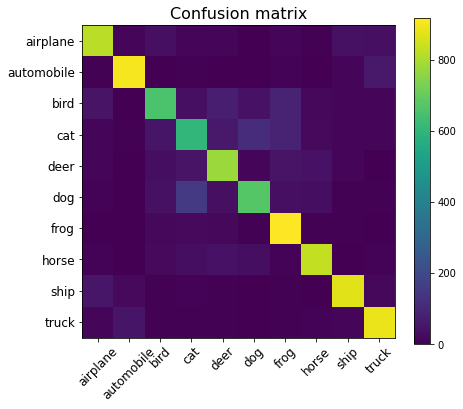

Test accuracy: 0.7956


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:28: MatplotlibDeprecationWarning: Passing unsupported keyword arguments to axis() will raise a TypeError in 3.3.


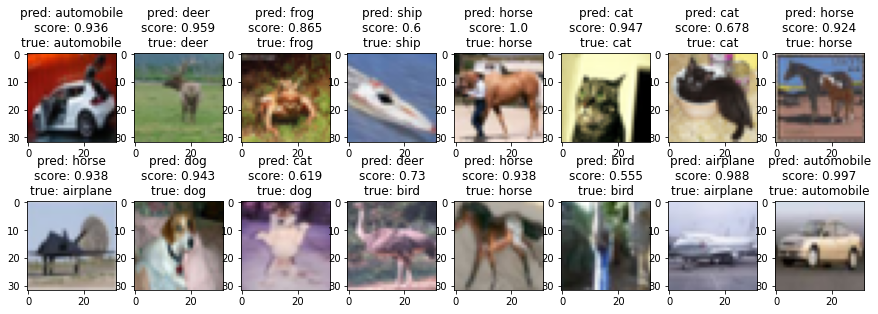

In [ ]:
# load weights from file (can call without model.fit)
model.load_weights(model_path_weight)

# make test predictions
y_pred_test = model.predict_proba(x_test2)
y_pred_test_classes = np.argmax(y_pred_test, axis=1)
y_pred_test_max_probas = np.max(y_pred_test, axis=1)

# Show the confusion matrix and accuracy
plt.figure(figsize=(7, 6))
plt.title('Confusion matrix', fontsize=16)
plt.imshow(confusion_matrix(y_test, y_pred_test_classes))
plt.xticks(np.arange(10), cifar10_classes, rotation=45, fontsize=12)
plt.yticks(np.arange(10), cifar10_classes, fontsize=12)
plt.colorbar()
plt.show()
print("Test accuracy:", accuracy_score(y_test, y_pred_test_classes))

# inspect preditions
cols = 8
rows = 2
fig = plt.figure(figsize=(2 * cols - 1, 3 * rows - 1))
for i in range(cols):
    for j in range(rows):
        random_index = np.random.randint(0, len(y_test))
        ax = fig.add_subplot(rows, cols, i * rows + j + 1)
        ax.grid(b=False)
        ax.axis(b=False)
        ax.imshow(x_test[random_index, :])
        pred_label = cifar10_classes[y_pred_test_classes[random_index]]
        pred_proba = y_pred_test_max_probas[random_index]
        true_label = cifar10_classes[y_test[random_index, 0]]
        ax.set_title("pred: {}\nscore: {:.3}\ntrue: {}".format(
               pred_label, pred_proba, true_label
        ))
plt.show()

##Experiment
The implementation for the experiment follows the steps below in the code given by the original problem description. Here we used the model of the above classifier c, and then used it to train the fake images generated from the generator, and finally used the fake labels and the fake images to train the classifier c'. The result shows that the acccuracy of the classifier c is 0.7919 and the accuracy of the classifier c' is 0.1. In the training process, the epoch was set to 200 in order to see if there's an improved result compared to epoch = 100. However, the results were not improved much and the potential reson is due to the training for the original classifier still need to be improved in oder to get a better result for the classifier c'. 

load gan model
Number of epochs: 450
Number of batches: 128


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


epoch = 1/450, d_loss=1.160, g_loss=1.868


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:58: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


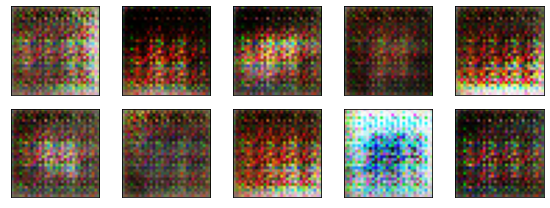

Time for epoch 1 is 31.33898687362671 sec
epoch = 2/450, d_loss=1.173, g_loss=0.596
Time for epoch 2 is 25.767678260803223 sec
epoch = 3/450, d_loss=0.972, g_loss=0.703
Time for epoch 3 is 25.02464008331299 sec
epoch = 4/450, d_loss=1.028, g_loss=1.117
Time for epoch 4 is 24.976874113082886 sec
epoch = 5/450, d_loss=0.863, g_loss=1.160
Time for epoch 5 is 25.017706155776978 sec
epoch = 6/450, d_loss=1.873, g_loss=0.752


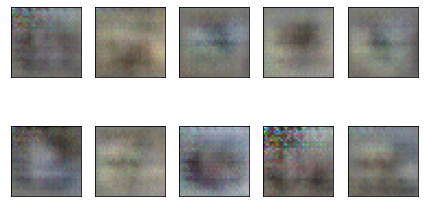

Time for epoch 6 is 26.05444097518921 sec
epoch = 7/450, d_loss=1.402, g_loss=0.820
Time for epoch 7 is 26.03262186050415 sec
epoch = 8/450, d_loss=1.357, g_loss=0.753
Time for epoch 8 is 25.745933055877686 sec
epoch = 9/450, d_loss=1.462, g_loss=0.748
Time for epoch 9 is 25.95529055595398 sec
epoch = 10/450, d_loss=1.458, g_loss=0.691
Time for epoch 10 is 25.802117347717285 sec
epoch = 11/450, d_loss=1.496, g_loss=0.711


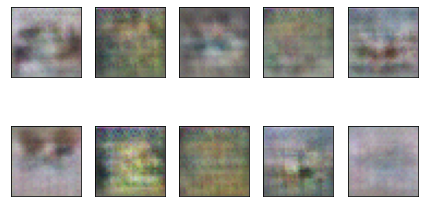

Time for epoch 11 is 25.78199863433838 sec
epoch = 12/450, d_loss=1.435, g_loss=0.765
Time for epoch 12 is 25.252592086791992 sec
epoch = 13/450, d_loss=1.380, g_loss=0.763
Time for epoch 13 is 25.209089517593384 sec
epoch = 14/450, d_loss=1.454, g_loss=0.707
Time for epoch 14 is 25.908021926879883 sec
epoch = 15/450, d_loss=1.419, g_loss=0.727
Time for epoch 15 is 25.219056129455566 sec
epoch = 16/450, d_loss=1.407, g_loss=0.748


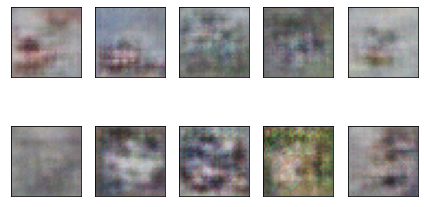

Time for epoch 16 is 26.275317192077637 sec
epoch = 17/450, d_loss=1.371, g_loss=0.739
Time for epoch 17 is 25.721721410751343 sec
epoch = 18/450, d_loss=1.410, g_loss=0.740
Time for epoch 18 is 25.098134756088257 sec
epoch = 19/450, d_loss=1.418, g_loss=0.713
Time for epoch 19 is 26.258203744888306 sec
epoch = 20/450, d_loss=1.357, g_loss=0.735
Time for epoch 20 is 25.533363103866577 sec
epoch = 21/450, d_loss=1.415, g_loss=0.721


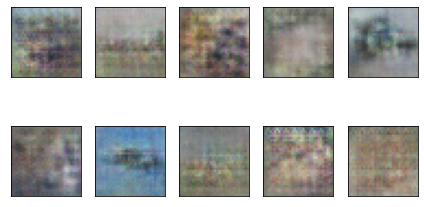

Time for epoch 21 is 25.64596438407898 sec
epoch = 22/450, d_loss=1.403, g_loss=0.729
Time for epoch 22 is 25.367974519729614 sec
epoch = 23/450, d_loss=1.417, g_loss=0.717
Time for epoch 23 is 25.629420518875122 sec
epoch = 24/450, d_loss=1.437, g_loss=0.729
Time for epoch 24 is 25.60631036758423 sec
epoch = 25/450, d_loss=1.409, g_loss=0.739
Time for epoch 25 is 25.484588146209717 sec
epoch = 26/450, d_loss=1.379, g_loss=0.757


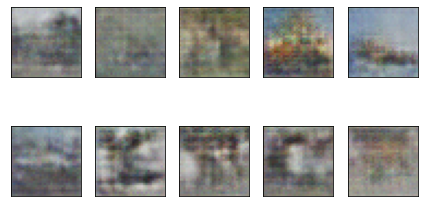

Time for epoch 26 is 26.263397693634033 sec
epoch = 27/450, d_loss=1.378, g_loss=0.729
Time for epoch 27 is 25.64468288421631 sec
epoch = 28/450, d_loss=1.404, g_loss=0.731
Time for epoch 28 is 25.60191297531128 sec
epoch = 29/450, d_loss=1.379, g_loss=0.687
Time for epoch 29 is 25.381880044937134 sec
epoch = 30/450, d_loss=1.398, g_loss=0.702
Time for epoch 30 is 25.641326904296875 sec
epoch = 31/450, d_loss=1.391, g_loss=0.720


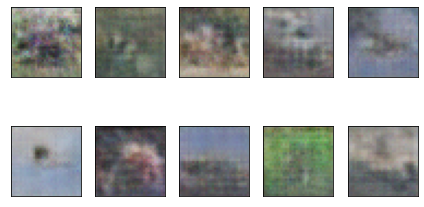

Time for epoch 31 is 26.25593400001526 sec
epoch = 32/450, d_loss=1.417, g_loss=0.708
Time for epoch 32 is 25.468342065811157 sec
epoch = 33/450, d_loss=1.411, g_loss=0.690
Time for epoch 33 is 25.231972217559814 sec
epoch = 34/450, d_loss=1.393, g_loss=0.730
Time for epoch 34 is 25.87697458267212 sec
epoch = 35/450, d_loss=1.414, g_loss=0.732
Time for epoch 35 is 25.507634162902832 sec
epoch = 36/450, d_loss=1.398, g_loss=0.712


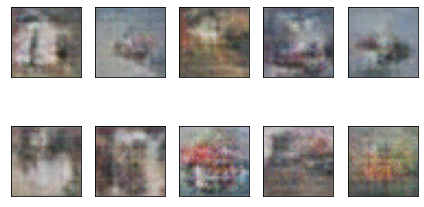

Time for epoch 36 is 25.28727674484253 sec
epoch = 37/450, d_loss=1.391, g_loss=0.730
Time for epoch 37 is 25.20171332359314 sec
epoch = 38/450, d_loss=1.411, g_loss=0.715
Time for epoch 38 is 25.588038206100464 sec
epoch = 39/450, d_loss=1.405, g_loss=0.707
Time for epoch 39 is 25.188938856124878 sec
epoch = 40/450, d_loss=1.402, g_loss=0.705
Time for epoch 40 is 25.39000701904297 sec
epoch = 41/450, d_loss=1.395, g_loss=0.712


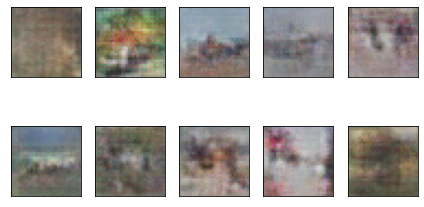

Time for epoch 41 is 25.62461757659912 sec
epoch = 42/450, d_loss=1.361, g_loss=0.732
Time for epoch 42 is 25.104876041412354 sec
epoch = 43/450, d_loss=1.390, g_loss=0.718
Time for epoch 43 is 26.23117995262146 sec
epoch = 44/450, d_loss=1.401, g_loss=0.712
Time for epoch 44 is 25.24315309524536 sec
epoch = 45/450, d_loss=1.416, g_loss=0.711
Time for epoch 45 is 25.187530279159546 sec
epoch = 46/450, d_loss=1.406, g_loss=0.714


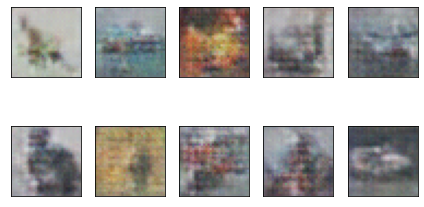

Time for epoch 46 is 25.493038177490234 sec
epoch = 47/450, d_loss=1.398, g_loss=0.700
Time for epoch 47 is 25.38070845603943 sec
epoch = 48/450, d_loss=1.376, g_loss=0.717
Time for epoch 48 is 25.211925268173218 sec
epoch = 49/450, d_loss=1.385, g_loss=0.733
Time for epoch 49 is 26.123342990875244 sec
epoch = 50/450, d_loss=1.397, g_loss=0.713
Time for epoch 50 is 25.0930495262146 sec
epoch = 51/450, d_loss=1.413, g_loss=0.709


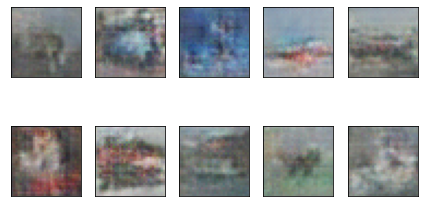

Time for epoch 51 is 25.692748546600342 sec
epoch = 52/450, d_loss=1.392, g_loss=0.724
Time for epoch 52 is 25.562833309173584 sec
epoch = 53/450, d_loss=1.363, g_loss=0.721
Time for epoch 53 is 25.581587553024292 sec
epoch = 54/450, d_loss=1.388, g_loss=0.726
Time for epoch 54 is 25.34869909286499 sec
epoch = 55/450, d_loss=1.398, g_loss=0.743
Time for epoch 55 is 25.880565404891968 sec
epoch = 56/450, d_loss=1.384, g_loss=0.707


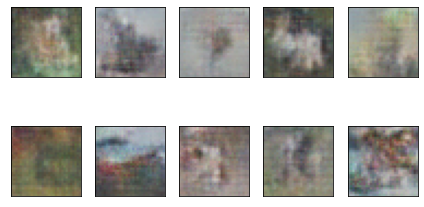

Time for epoch 56 is 25.492491960525513 sec
epoch = 57/450, d_loss=1.395, g_loss=0.700
Time for epoch 57 is 25.67284321784973 sec
epoch = 58/450, d_loss=1.382, g_loss=0.712
Time for epoch 58 is 25.36292839050293 sec
epoch = 59/450, d_loss=1.379, g_loss=0.722
Time for epoch 59 is 25.594398021697998 sec
epoch = 60/450, d_loss=1.433, g_loss=0.709
Time for epoch 60 is 25.433153867721558 sec
epoch = 61/450, d_loss=1.401, g_loss=0.723


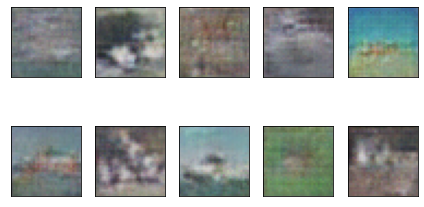

Time for epoch 61 is 25.811699867248535 sec
epoch = 62/450, d_loss=1.406, g_loss=0.706
Time for epoch 62 is 25.07418942451477 sec
epoch = 63/450, d_loss=1.374, g_loss=0.729
Time for epoch 63 is 25.304651021957397 sec
epoch = 64/450, d_loss=1.358, g_loss=0.748
Time for epoch 64 is 25.54300570487976 sec
epoch = 65/450, d_loss=1.390, g_loss=0.705
Time for epoch 65 is 25.401612758636475 sec
epoch = 66/450, d_loss=1.403, g_loss=0.728


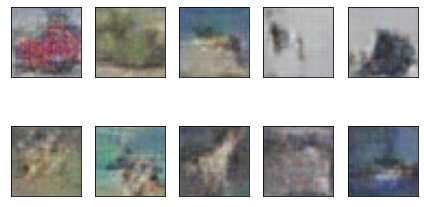

Time for epoch 66 is 25.66524887084961 sec
epoch = 67/450, d_loss=1.363, g_loss=0.703
Time for epoch 67 is 25.434648513793945 sec
epoch = 68/450, d_loss=1.386, g_loss=0.703
Time for epoch 68 is 26.159186840057373 sec
epoch = 69/450, d_loss=1.385, g_loss=0.720
Time for epoch 69 is 25.188384294509888 sec
epoch = 70/450, d_loss=1.394, g_loss=0.715
Time for epoch 70 is 25.311465978622437 sec
epoch = 71/450, d_loss=1.377, g_loss=0.716


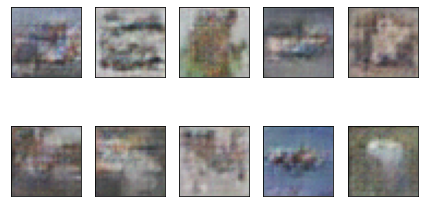

Time for epoch 71 is 25.81132459640503 sec
epoch = 72/450, d_loss=1.386, g_loss=0.720
Time for epoch 72 is 25.644744157791138 sec
epoch = 73/450, d_loss=1.352, g_loss=0.729
Time for epoch 73 is 25.55750584602356 sec
epoch = 74/450, d_loss=1.359, g_loss=0.730
Time for epoch 74 is 25.56967043876648 sec
epoch = 75/450, d_loss=1.391, g_loss=0.716
Time for epoch 75 is 25.25364065170288 sec
epoch = 76/450, d_loss=1.380, g_loss=0.711


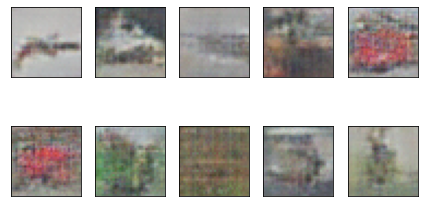

Time for epoch 76 is 25.741666316986084 sec
epoch = 77/450, d_loss=1.376, g_loss=0.736
Time for epoch 77 is 25.395114421844482 sec
epoch = 78/450, d_loss=1.383, g_loss=0.728
Time for epoch 78 is 25.23883056640625 sec
epoch = 79/450, d_loss=1.369, g_loss=0.734
Time for epoch 79 is 26.23081088066101 sec
epoch = 80/450, d_loss=1.406, g_loss=0.724
Time for epoch 80 is 25.357436656951904 sec
epoch = 81/450, d_loss=1.371, g_loss=0.738


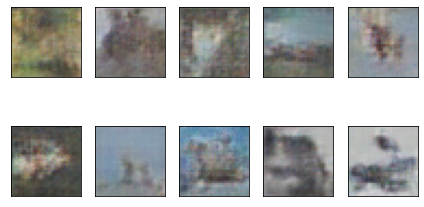

Time for epoch 81 is 26.22521471977234 sec
epoch = 82/450, d_loss=1.380, g_loss=0.735
Time for epoch 82 is 25.744853734970093 sec
epoch = 83/450, d_loss=1.367, g_loss=0.748
Time for epoch 83 is 25.061312675476074 sec
epoch = 84/450, d_loss=1.350, g_loss=0.740
Time for epoch 84 is 25.087860107421875 sec
epoch = 85/450, d_loss=1.383, g_loss=0.728
Time for epoch 85 is 25.441310167312622 sec
epoch = 86/450, d_loss=1.382, g_loss=0.714


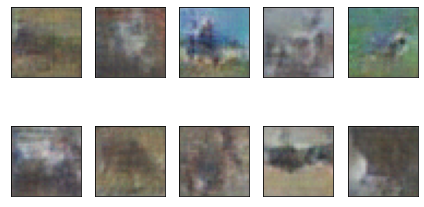

Time for epoch 86 is 25.731887340545654 sec
epoch = 87/450, d_loss=1.364, g_loss=0.742
Time for epoch 87 is 25.217279195785522 sec
epoch = 88/450, d_loss=1.372, g_loss=0.721
Time for epoch 88 is 25.000695943832397 sec
epoch = 89/450, d_loss=1.379, g_loss=0.747
Time for epoch 89 is 24.90911889076233 sec
epoch = 90/450, d_loss=1.392, g_loss=0.715
Time for epoch 90 is 24.96060562133789 sec
epoch = 91/450, d_loss=1.355, g_loss=0.745


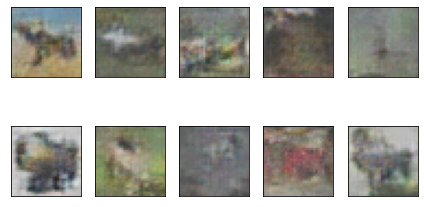

Time for epoch 91 is 25.37218928337097 sec
epoch = 92/450, d_loss=1.345, g_loss=0.759
Time for epoch 92 is 25.765556573867798 sec
epoch = 93/450, d_loss=1.367, g_loss=0.737
Time for epoch 93 is 25.583715438842773 sec
epoch = 94/450, d_loss=1.328, g_loss=0.740
Time for epoch 94 is 25.37167525291443 sec
epoch = 95/450, d_loss=1.351, g_loss=0.762
Time for epoch 95 is 25.764501571655273 sec
epoch = 96/450, d_loss=1.330, g_loss=0.749


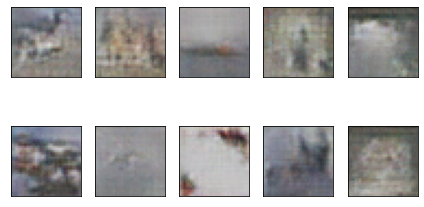

Time for epoch 96 is 25.479667901992798 sec
epoch = 97/450, d_loss=1.330, g_loss=0.797
Time for epoch 97 is 25.167140007019043 sec
epoch = 98/450, d_loss=1.404, g_loss=0.729
Time for epoch 98 is 24.91621494293213 sec
epoch = 99/450, d_loss=1.379, g_loss=0.700
Time for epoch 99 is 25.123359203338623 sec
epoch = 100/450, d_loss=1.372, g_loss=0.750
Time for epoch 100 is 25.30313801765442 sec
epoch = 101/450, d_loss=1.361, g_loss=0.747


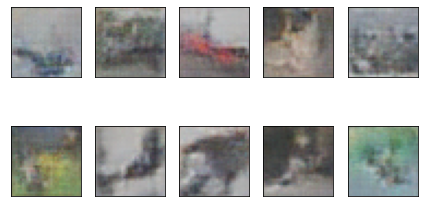

Time for epoch 101 is 25.16146469116211 sec
epoch = 102/450, d_loss=1.341, g_loss=0.745
Time for epoch 102 is 25.16111469268799 sec
epoch = 103/450, d_loss=1.380, g_loss=0.734
Time for epoch 103 is 25.287348985671997 sec
epoch = 104/450, d_loss=1.360, g_loss=0.739
Time for epoch 104 is 26.001996278762817 sec
epoch = 105/450, d_loss=1.405, g_loss=0.726
Time for epoch 105 is 25.583995580673218 sec
epoch = 106/450, d_loss=1.360, g_loss=0.713


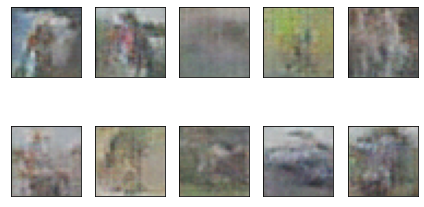

Time for epoch 106 is 25.828400373458862 sec
epoch = 107/450, d_loss=1.352, g_loss=0.723
Time for epoch 107 is 25.291024446487427 sec
epoch = 108/450, d_loss=1.372, g_loss=0.759
Time for epoch 108 is 25.35993194580078 sec
epoch = 109/450, d_loss=1.345, g_loss=0.719
Time for epoch 109 is 25.639367818832397 sec
epoch = 110/450, d_loss=1.344, g_loss=0.719
Time for epoch 110 is 25.315311193466187 sec
epoch = 111/450, d_loss=1.359, g_loss=0.735


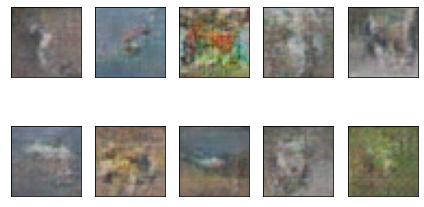

Time for epoch 111 is 26.178094387054443 sec
epoch = 112/450, d_loss=1.352, g_loss=0.750
Time for epoch 112 is 25.567423582077026 sec
epoch = 113/450, d_loss=1.386, g_loss=0.719
Time for epoch 113 is 24.975012063980103 sec
epoch = 114/450, d_loss=1.347, g_loss=0.722
Time for epoch 114 is 25.154349327087402 sec
epoch = 115/450, d_loss=1.335, g_loss=0.733
Time for epoch 115 is 25.44942879676819 sec
epoch = 116/450, d_loss=1.378, g_loss=0.751


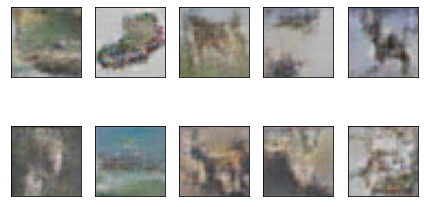

Time for epoch 116 is 26.230461597442627 sec
epoch = 117/450, d_loss=1.357, g_loss=0.763
Time for epoch 117 is 25.978798627853394 sec
epoch = 118/450, d_loss=1.355, g_loss=0.767
Time for epoch 118 is 25.488260507583618 sec
epoch = 119/450, d_loss=1.400, g_loss=0.743
Time for epoch 119 is 25.53055739402771 sec
epoch = 120/450, d_loss=1.358, g_loss=0.772
Time for epoch 120 is 25.677356004714966 sec
epoch = 121/450, d_loss=1.373, g_loss=0.773


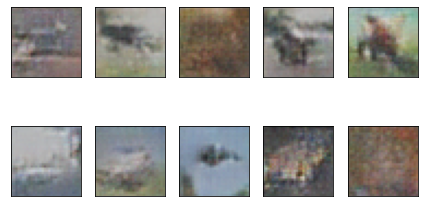

Time for epoch 121 is 26.40073251724243 sec
epoch = 122/450, d_loss=1.358, g_loss=0.748
Time for epoch 122 is 25.934067010879517 sec
epoch = 123/450, d_loss=1.357, g_loss=0.776
Time for epoch 123 is 25.552215576171875 sec
epoch = 124/450, d_loss=1.327, g_loss=0.768
Time for epoch 124 is 26.030900478363037 sec
epoch = 125/450, d_loss=1.398, g_loss=0.738
Time for epoch 125 is 25.663617610931396 sec
epoch = 126/450, d_loss=1.333, g_loss=0.747


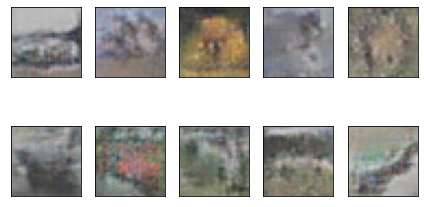

Time for epoch 126 is 26.342963695526123 sec
epoch = 127/450, d_loss=1.325, g_loss=0.745
Time for epoch 127 is 26.01958394050598 sec
epoch = 128/450, d_loss=1.357, g_loss=0.759
Time for epoch 128 is 26.24370574951172 sec
epoch = 129/450, d_loss=1.293, g_loss=0.745
Time for epoch 129 is 26.164583921432495 sec
epoch = 130/450, d_loss=1.327, g_loss=0.807
Time for epoch 130 is 26.115373373031616 sec
epoch = 131/450, d_loss=1.363, g_loss=0.742


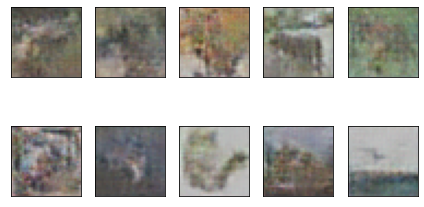

Time for epoch 131 is 26.507303476333618 sec
epoch = 132/450, d_loss=1.365, g_loss=0.769
Time for epoch 132 is 26.147558450698853 sec
epoch = 133/450, d_loss=1.330, g_loss=0.805
Time for epoch 133 is 25.940215587615967 sec
epoch = 134/450, d_loss=1.384, g_loss=0.740
Time for epoch 134 is 26.282737016677856 sec
epoch = 135/450, d_loss=1.331, g_loss=0.732
Time for epoch 135 is 26.334282875061035 sec
epoch = 136/450, d_loss=1.310, g_loss=0.773


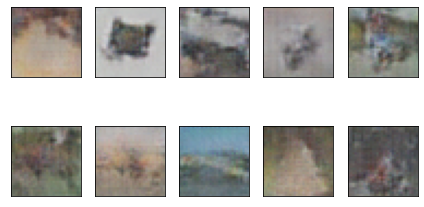

Time for epoch 136 is 26.53837251663208 sec
epoch = 137/450, d_loss=1.413, g_loss=0.737
Time for epoch 137 is 25.74968433380127 sec
epoch = 138/450, d_loss=1.278, g_loss=0.734
Time for epoch 138 is 26.117775201797485 sec
epoch = 139/450, d_loss=1.296, g_loss=0.760
Time for epoch 139 is 26.609755516052246 sec
epoch = 140/450, d_loss=1.322, g_loss=0.769
Time for epoch 140 is 26.74889326095581 sec
epoch = 141/450, d_loss=1.369, g_loss=0.732


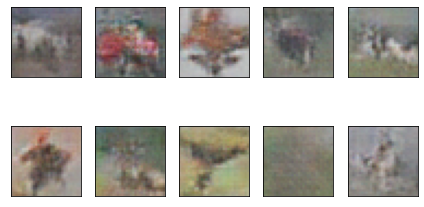

Time for epoch 141 is 26.548006534576416 sec
epoch = 142/450, d_loss=1.365, g_loss=0.767
Time for epoch 142 is 26.674471139907837 sec
epoch = 143/450, d_loss=1.350, g_loss=0.732
Time for epoch 143 is 26.232409238815308 sec
epoch = 144/450, d_loss=1.321, g_loss=0.798
Time for epoch 144 is 26.075177431106567 sec
epoch = 145/450, d_loss=1.349, g_loss=0.826
Time for epoch 145 is 26.604728937149048 sec
epoch = 146/450, d_loss=1.406, g_loss=0.803


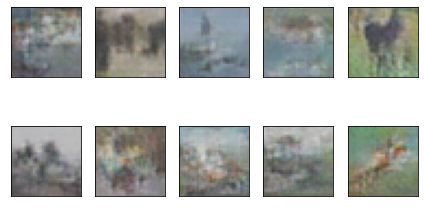

Time for epoch 146 is 26.904019594192505 sec
epoch = 147/450, d_loss=1.354, g_loss=0.783
Time for epoch 147 is 26.054795503616333 sec
epoch = 148/450, d_loss=1.346, g_loss=0.834
Time for epoch 148 is 26.33848261833191 sec
epoch = 149/450, d_loss=1.323, g_loss=0.815
Time for epoch 149 is 26.31889510154724 sec
epoch = 150/450, d_loss=1.308, g_loss=0.763
Time for epoch 150 is 26.288201332092285 sec
epoch = 151/450, d_loss=1.345, g_loss=0.817


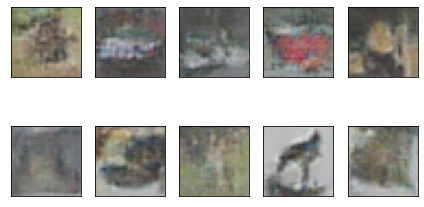

Time for epoch 151 is 26.566838264465332 sec
epoch = 152/450, d_loss=1.362, g_loss=0.770
Time for epoch 152 is 26.8668692111969 sec
epoch = 153/450, d_loss=1.347, g_loss=0.738
Time for epoch 153 is 26.48511815071106 sec
epoch = 154/450, d_loss=1.283, g_loss=0.735
Time for epoch 154 is 26.21014165878296 sec
epoch = 155/450, d_loss=1.293, g_loss=0.841
Time for epoch 155 is 26.32304072380066 sec
epoch = 156/450, d_loss=1.305, g_loss=0.788


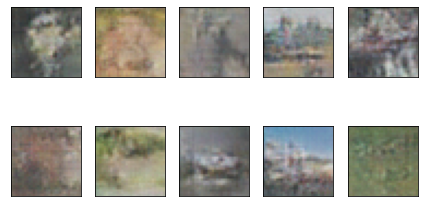

Time for epoch 156 is 26.519397020339966 sec
epoch = 157/450, d_loss=1.410, g_loss=0.753
Time for epoch 157 is 26.40346932411194 sec
epoch = 158/450, d_loss=1.341, g_loss=0.806
Time for epoch 158 is 26.631108045578003 sec
epoch = 159/450, d_loss=1.338, g_loss=0.789
Time for epoch 159 is 26.472431421279907 sec
epoch = 160/450, d_loss=1.397, g_loss=0.785
Time for epoch 160 is 26.72911238670349 sec
epoch = 161/450, d_loss=1.331, g_loss=0.807


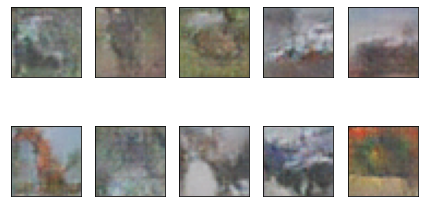

Time for epoch 161 is 26.377305507659912 sec
epoch = 162/450, d_loss=1.325, g_loss=0.770
Time for epoch 162 is 26.561968088150024 sec
epoch = 163/450, d_loss=1.294, g_loss=0.798
Time for epoch 163 is 26.684677600860596 sec
epoch = 164/450, d_loss=1.287, g_loss=0.811
Time for epoch 164 is 26.58990168571472 sec
epoch = 165/450, d_loss=1.241, g_loss=0.836
Time for epoch 165 is 26.11142325401306 sec
epoch = 166/450, d_loss=1.315, g_loss=0.793


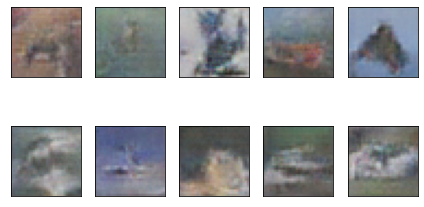

Time for epoch 166 is 27.24809193611145 sec
epoch = 167/450, d_loss=1.317, g_loss=0.813
Time for epoch 167 is 26.38957953453064 sec
epoch = 168/450, d_loss=1.356, g_loss=0.677
Time for epoch 168 is 26.87683892250061 sec
epoch = 169/450, d_loss=1.326, g_loss=0.784
Time for epoch 169 is 26.39864158630371 sec
epoch = 170/450, d_loss=1.272, g_loss=0.822
Time for epoch 170 is 26.495458841323853 sec
epoch = 171/450, d_loss=1.322, g_loss=0.839


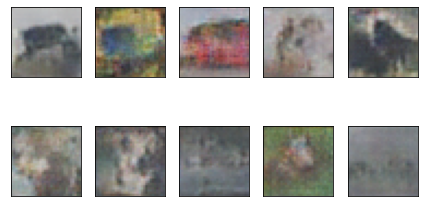

Time for epoch 171 is 26.805172204971313 sec
epoch = 172/450, d_loss=1.293, g_loss=0.791
Time for epoch 172 is 26.376308917999268 sec
epoch = 173/450, d_loss=1.297, g_loss=0.737
Time for epoch 173 is 26.494176626205444 sec
epoch = 174/450, d_loss=1.354, g_loss=0.788
Time for epoch 174 is 26.83159875869751 sec
epoch = 175/450, d_loss=1.295, g_loss=0.803
Time for epoch 175 is 27.009369134902954 sec
epoch = 176/450, d_loss=1.353, g_loss=0.842


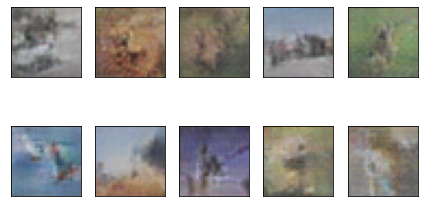

Time for epoch 176 is 26.556332111358643 sec
epoch = 177/450, d_loss=1.325, g_loss=0.817
Time for epoch 177 is 26.428858041763306 sec
epoch = 178/450, d_loss=1.214, g_loss=0.833
Time for epoch 178 is 26.226162672042847 sec
epoch = 179/450, d_loss=1.265, g_loss=0.824
Time for epoch 179 is 26.281372785568237 sec
epoch = 180/450, d_loss=1.342, g_loss=0.756
Time for epoch 180 is 25.924391269683838 sec
epoch = 181/450, d_loss=1.305, g_loss=0.779


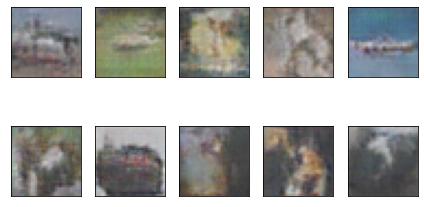

Time for epoch 181 is 26.72107195854187 sec
epoch = 182/450, d_loss=1.177, g_loss=0.794
Time for epoch 182 is 25.951213359832764 sec
epoch = 183/450, d_loss=1.332, g_loss=0.887
Time for epoch 183 is 26.10763931274414 sec
epoch = 184/450, d_loss=1.230, g_loss=0.840
Time for epoch 184 is 26.38284707069397 sec
epoch = 185/450, d_loss=1.411, g_loss=0.831
Time for epoch 185 is 26.500210523605347 sec
epoch = 186/450, d_loss=1.277, g_loss=0.804


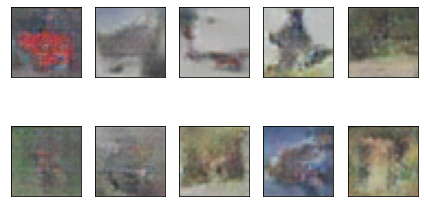

Time for epoch 186 is 26.750054597854614 sec
epoch = 187/450, d_loss=1.358, g_loss=0.823
Time for epoch 187 is 27.11710548400879 sec
epoch = 188/450, d_loss=1.362, g_loss=0.848
Time for epoch 188 is 26.555837392807007 sec
epoch = 189/450, d_loss=1.331, g_loss=0.880
Time for epoch 189 is 26.146595239639282 sec
epoch = 190/450, d_loss=1.263, g_loss=0.818
Time for epoch 190 is 26.873607635498047 sec
epoch = 191/450, d_loss=1.300, g_loss=0.850


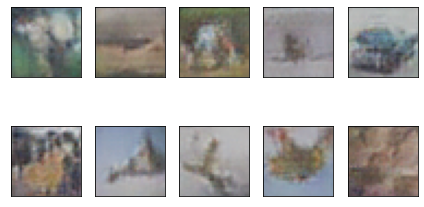

Time for epoch 191 is 26.665604829788208 sec
epoch = 192/450, d_loss=1.278, g_loss=0.821
Time for epoch 192 is 26.588042497634888 sec
epoch = 193/450, d_loss=1.338, g_loss=0.786
Time for epoch 193 is 26.507768630981445 sec
epoch = 194/450, d_loss=1.237, g_loss=0.872
Time for epoch 194 is 26.116496562957764 sec
epoch = 195/450, d_loss=1.303, g_loss=0.867
Time for epoch 195 is 26.18712592124939 sec
epoch = 196/450, d_loss=1.213, g_loss=0.851


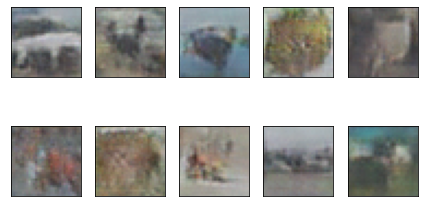

Time for epoch 196 is 26.8250834941864 sec
epoch = 197/450, d_loss=1.299, g_loss=0.914
Time for epoch 197 is 26.990631580352783 sec
epoch = 198/450, d_loss=1.346, g_loss=1.037
Time for epoch 198 is 27.10482883453369 sec
epoch = 199/450, d_loss=1.256, g_loss=0.877
Time for epoch 199 is 27.081542015075684 sec
epoch = 200/450, d_loss=1.264, g_loss=0.858
Time for epoch 200 is 26.41575598716736 sec
epoch = 201/450, d_loss=1.337, g_loss=0.778


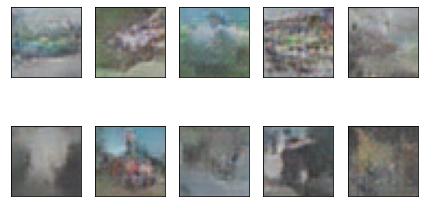

Time for epoch 201 is 26.661414861679077 sec
epoch = 202/450, d_loss=1.410, g_loss=0.822
Time for epoch 202 is 26.560893297195435 sec
epoch = 203/450, d_loss=1.236, g_loss=0.912
Time for epoch 203 is 26.616019010543823 sec
epoch = 204/450, d_loss=1.274, g_loss=0.870
Time for epoch 204 is 26.813856840133667 sec
epoch = 205/450, d_loss=1.323, g_loss=0.754
Time for epoch 205 is 26.462443113327026 sec
epoch = 206/450, d_loss=1.357, g_loss=0.951


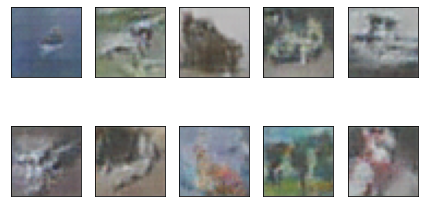

Time for epoch 206 is 27.10369062423706 sec
epoch = 207/450, d_loss=1.253, g_loss=0.897
Time for epoch 207 is 26.871561288833618 sec
epoch = 208/450, d_loss=1.342, g_loss=0.832
Time for epoch 208 is 26.87528419494629 sec
epoch = 209/450, d_loss=1.336, g_loss=0.741
Time for epoch 209 is 26.61199140548706 sec
epoch = 210/450, d_loss=1.236, g_loss=0.885
Time for epoch 210 is 26.82408356666565 sec
epoch = 211/450, d_loss=1.286, g_loss=0.865


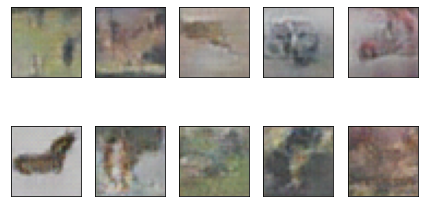

Time for epoch 211 is 27.442708492279053 sec
epoch = 212/450, d_loss=1.287, g_loss=0.787
Time for epoch 212 is 26.19606041908264 sec
epoch = 213/450, d_loss=1.340, g_loss=0.884
Time for epoch 213 is 26.0267071723938 sec
epoch = 214/450, d_loss=1.369, g_loss=0.815
Time for epoch 214 is 26.575029850006104 sec
epoch = 215/450, d_loss=1.166, g_loss=0.842
Time for epoch 215 is 26.40582823753357 sec
epoch = 216/450, d_loss=1.439, g_loss=0.801


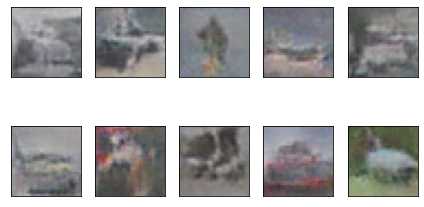

Time for epoch 216 is 27.27783226966858 sec
epoch = 217/450, d_loss=1.316, g_loss=0.819
Time for epoch 217 is 26.3810555934906 sec
epoch = 218/450, d_loss=1.109, g_loss=0.765
Time for epoch 218 is 26.288551807403564 sec
epoch = 219/450, d_loss=1.261, g_loss=0.997
Time for epoch 219 is 26.676291704177856 sec
epoch = 220/450, d_loss=1.287, g_loss=0.908
Time for epoch 220 is 26.35247492790222 sec
epoch = 221/450, d_loss=1.246, g_loss=0.872


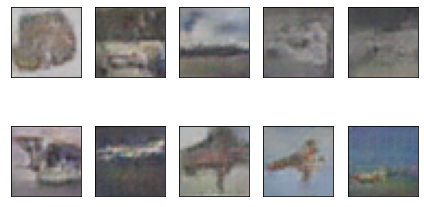

Time for epoch 221 is 27.250614881515503 sec
epoch = 222/450, d_loss=1.286, g_loss=0.847
Time for epoch 222 is 26.622676849365234 sec
epoch = 223/450, d_loss=1.198, g_loss=0.812
Time for epoch 223 is 26.49357032775879 sec
epoch = 224/450, d_loss=1.134, g_loss=0.802
Time for epoch 224 is 26.698481798171997 sec
epoch = 225/450, d_loss=1.230, g_loss=0.896
Time for epoch 225 is 26.359258890151978 sec
epoch = 226/450, d_loss=1.294, g_loss=0.866


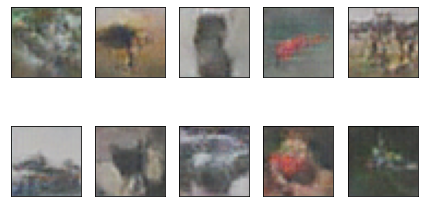

Time for epoch 226 is 26.937543630599976 sec
epoch = 227/450, d_loss=1.201, g_loss=0.826
Time for epoch 227 is 26.511415719985962 sec
epoch = 228/450, d_loss=1.152, g_loss=0.866
Time for epoch 228 is 26.909783601760864 sec
epoch = 229/450, d_loss=1.310, g_loss=0.866
Time for epoch 229 is 26.653406858444214 sec
epoch = 230/450, d_loss=1.118, g_loss=0.847
Time for epoch 230 is 26.54996085166931 sec
epoch = 231/450, d_loss=1.277, g_loss=0.901


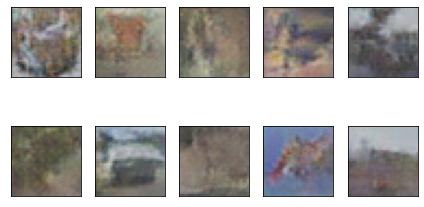

Time for epoch 231 is 27.065919399261475 sec
epoch = 232/450, d_loss=1.262, g_loss=0.854
Time for epoch 232 is 26.644495010375977 sec
epoch = 233/450, d_loss=1.204, g_loss=0.852
Time for epoch 233 is 26.37517499923706 sec
epoch = 234/450, d_loss=1.217, g_loss=0.938
Time for epoch 234 is 27.333276510238647 sec
epoch = 235/450, d_loss=1.291, g_loss=0.846
Time for epoch 235 is 26.905962228775024 sec
epoch = 236/450, d_loss=1.178, g_loss=0.967


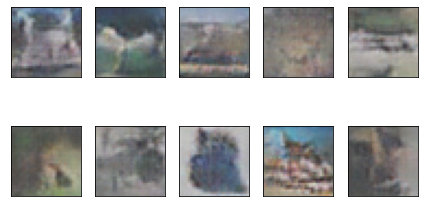

Time for epoch 236 is 26.563345670700073 sec
epoch = 237/450, d_loss=1.134, g_loss=0.882
Time for epoch 237 is 26.494272232055664 sec
epoch = 238/450, d_loss=1.226, g_loss=0.932
Time for epoch 238 is 26.938528537750244 sec
epoch = 239/450, d_loss=1.130, g_loss=0.930
Time for epoch 239 is 26.33025336265564 sec
epoch = 240/450, d_loss=1.157, g_loss=0.935
Time for epoch 240 is 26.162611961364746 sec
epoch = 241/450, d_loss=1.279, g_loss=0.966


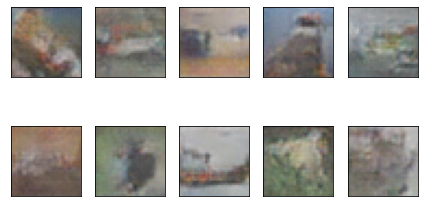

Time for epoch 241 is 26.74083161354065 sec
epoch = 242/450, d_loss=1.219, g_loss=0.881
Time for epoch 242 is 26.928964376449585 sec
epoch = 243/450, d_loss=1.280, g_loss=0.917
Time for epoch 243 is 26.81575894355774 sec
epoch = 244/450, d_loss=1.415, g_loss=0.903
Time for epoch 244 is 26.586292266845703 sec
epoch = 245/450, d_loss=1.197, g_loss=0.883
Time for epoch 245 is 27.040165185928345 sec
epoch = 246/450, d_loss=1.153, g_loss=0.887


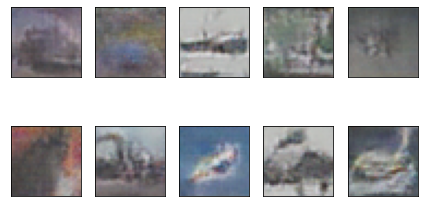

Time for epoch 246 is 27.5097496509552 sec
epoch = 247/450, d_loss=1.204, g_loss=0.989
Time for epoch 247 is 26.528202772140503 sec
epoch = 248/450, d_loss=1.205, g_loss=0.968
Time for epoch 248 is 26.955679178237915 sec
epoch = 249/450, d_loss=1.078, g_loss=1.102
Time for epoch 249 is 26.21495795249939 sec
epoch = 250/450, d_loss=1.151, g_loss=0.917
Time for epoch 250 is 26.80131959915161 sec
epoch = 251/450, d_loss=1.211, g_loss=0.965


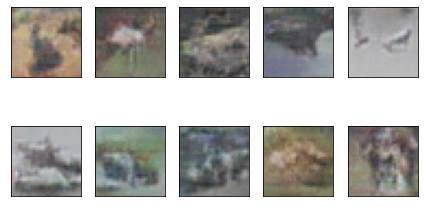

Time for epoch 251 is 26.82850670814514 sec
epoch = 252/450, d_loss=1.032, g_loss=0.842
Time for epoch 252 is 26.335811376571655 sec
epoch = 253/450, d_loss=1.088, g_loss=0.939
Time for epoch 253 is 26.443854093551636 sec
epoch = 254/450, d_loss=1.179, g_loss=0.974
Time for epoch 254 is 26.57017159461975 sec
epoch = 255/450, d_loss=1.199, g_loss=0.894
Time for epoch 255 is 26.712642192840576 sec
epoch = 256/450, d_loss=1.178, g_loss=1.055


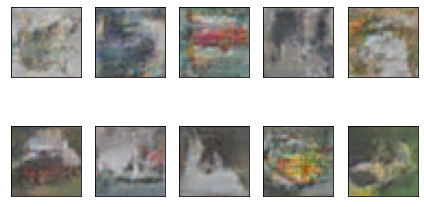

Time for epoch 256 is 26.810834407806396 sec
epoch = 257/450, d_loss=1.231, g_loss=0.919
Time for epoch 257 is 27.075329303741455 sec
epoch = 258/450, d_loss=1.189, g_loss=0.890
Time for epoch 258 is 26.676848888397217 sec
epoch = 259/450, d_loss=1.218, g_loss=0.882
Time for epoch 259 is 26.495818376541138 sec
epoch = 260/450, d_loss=1.272, g_loss=1.029
Time for epoch 260 is 26.558430194854736 sec
epoch = 261/450, d_loss=1.220, g_loss=0.913


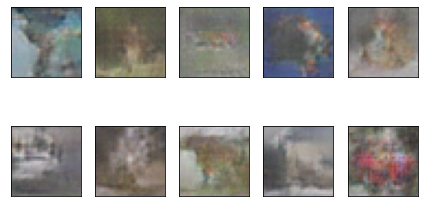

Time for epoch 261 is 26.98904800415039 sec
epoch = 262/450, d_loss=1.153, g_loss=0.989
Time for epoch 262 is 26.80135726928711 sec
epoch = 263/450, d_loss=1.055, g_loss=0.964
Time for epoch 263 is 26.868894577026367 sec
epoch = 264/450, d_loss=1.105, g_loss=1.042
Time for epoch 264 is 26.831289291381836 sec
epoch = 265/450, d_loss=1.095, g_loss=1.151
Time for epoch 265 is 26.655088901519775 sec
epoch = 266/450, d_loss=1.340, g_loss=0.931


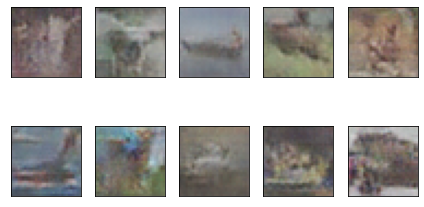

Time for epoch 266 is 27.964102506637573 sec
epoch = 267/450, d_loss=1.192, g_loss=0.964
Time for epoch 267 is 26.790515661239624 sec
epoch = 268/450, d_loss=1.110, g_loss=0.957
Time for epoch 268 is 27.024363040924072 sec
epoch = 269/450, d_loss=1.060, g_loss=0.989
Time for epoch 269 is 26.84571623802185 sec
epoch = 270/450, d_loss=1.122, g_loss=1.020
Time for epoch 270 is 27.099414587020874 sec
epoch = 271/450, d_loss=1.394, g_loss=1.068


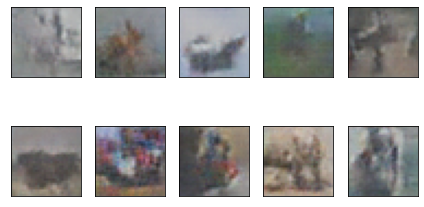

Time for epoch 271 is 27.188066482543945 sec
epoch = 272/450, d_loss=1.181, g_loss=1.172
Time for epoch 272 is 26.85227060317993 sec
epoch = 273/450, d_loss=1.134, g_loss=1.048
Time for epoch 273 is 26.515121698379517 sec
epoch = 274/450, d_loss=1.075, g_loss=0.958
Time for epoch 274 is 26.475021362304688 sec
epoch = 275/450, d_loss=1.005, g_loss=1.048
Time for epoch 275 is 27.231454610824585 sec
epoch = 276/450, d_loss=1.130, g_loss=1.011


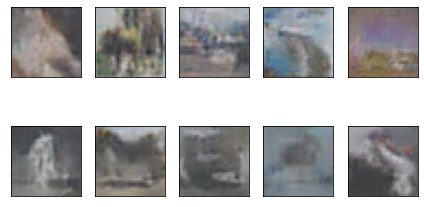

Time for epoch 276 is 27.696627855300903 sec
epoch = 277/450, d_loss=0.907, g_loss=1.026
Time for epoch 277 is 26.570430517196655 sec
epoch = 278/450, d_loss=1.152, g_loss=1.042
Time for epoch 278 is 26.93977403640747 sec
epoch = 279/450, d_loss=1.023, g_loss=1.106
Time for epoch 279 is 26.934521913528442 sec
epoch = 280/450, d_loss=1.337, g_loss=0.963
Time for epoch 280 is 27.116409063339233 sec
epoch = 281/450, d_loss=1.190, g_loss=1.084


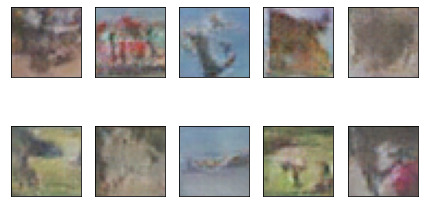

Time for epoch 281 is 27.20006012916565 sec
epoch = 282/450, d_loss=0.865, g_loss=1.291
Time for epoch 282 is 26.47226095199585 sec
epoch = 283/450, d_loss=1.028, g_loss=1.111
Time for epoch 283 is 26.58135962486267 sec
epoch = 284/450, d_loss=1.057, g_loss=0.950
Time for epoch 284 is 26.172930240631104 sec
epoch = 285/450, d_loss=0.982, g_loss=0.990
Time for epoch 285 is 26.354230403900146 sec
epoch = 286/450, d_loss=1.204, g_loss=0.934


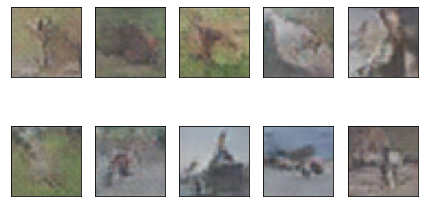

Time for epoch 286 is 27.07554841041565 sec
epoch = 287/450, d_loss=1.110, g_loss=1.236
Time for epoch 287 is 26.610061407089233 sec
epoch = 288/450, d_loss=0.981, g_loss=1.083
Time for epoch 288 is 26.65622353553772 sec
epoch = 289/450, d_loss=1.429, g_loss=1.022
Time for epoch 289 is 26.866009950637817 sec
epoch = 290/450, d_loss=1.253, g_loss=0.958
Time for epoch 290 is 26.838451862335205 sec
epoch = 291/450, d_loss=0.878, g_loss=1.387


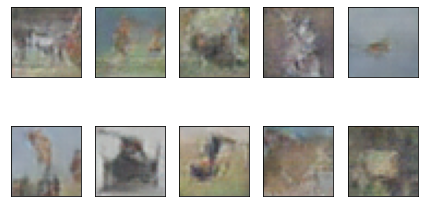

Time for epoch 291 is 26.969545364379883 sec
epoch = 292/450, d_loss=1.210, g_loss=1.108
Time for epoch 292 is 26.57863759994507 sec
epoch = 293/450, d_loss=1.034, g_loss=0.825
Time for epoch 293 is 26.861860275268555 sec
epoch = 294/450, d_loss=1.057, g_loss=1.257
Time for epoch 294 is 26.38633918762207 sec
epoch = 295/450, d_loss=1.037, g_loss=1.203
Time for epoch 295 is 26.68943452835083 sec
epoch = 296/450, d_loss=1.168, g_loss=1.049


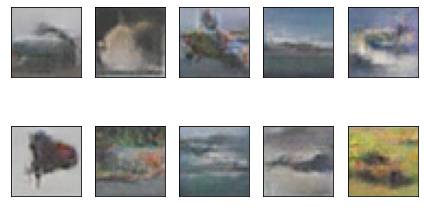

Time for epoch 296 is 26.80331063270569 sec
epoch = 297/450, d_loss=1.073, g_loss=0.986
Time for epoch 297 is 26.44079303741455 sec
epoch = 298/450, d_loss=1.112, g_loss=1.135
Time for epoch 298 is 26.567979097366333 sec
epoch = 299/450, d_loss=0.987, g_loss=1.069
Time for epoch 299 is 26.400830268859863 sec
epoch = 300/450, d_loss=1.281, g_loss=1.134
Time for epoch 300 is 26.883532524108887 sec
epoch = 301/450, d_loss=0.891, g_loss=1.033


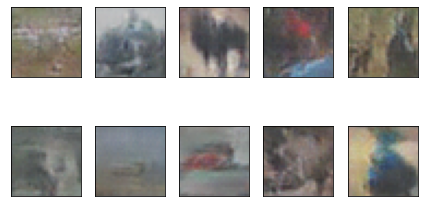

Time for epoch 301 is 26.882609128952026 sec
epoch = 302/450, d_loss=1.064, g_loss=0.993
Time for epoch 302 is 26.313987016677856 sec
epoch = 303/450, d_loss=1.335, g_loss=1.098
Time for epoch 303 is 27.113283157348633 sec
epoch = 304/450, d_loss=1.152, g_loss=0.947
Time for epoch 304 is 26.886775016784668 sec
epoch = 305/450, d_loss=0.940, g_loss=1.312
Time for epoch 305 is 26.783159255981445 sec
epoch = 306/450, d_loss=1.010, g_loss=1.363


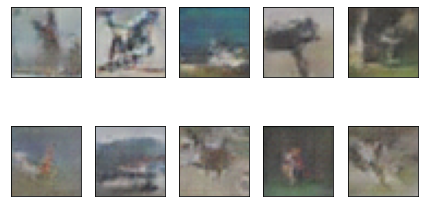

Time for epoch 306 is 26.668057203292847 sec
epoch = 307/450, d_loss=0.876, g_loss=1.341
Time for epoch 307 is 26.664401292800903 sec
epoch = 308/450, d_loss=1.151, g_loss=0.983
Time for epoch 308 is 26.84876012802124 sec
epoch = 309/450, d_loss=0.993, g_loss=1.011
Time for epoch 309 is 26.09576940536499 sec
epoch = 310/450, d_loss=0.905, g_loss=1.119
Time for epoch 310 is 26.439696788787842 sec
epoch = 311/450, d_loss=0.931, g_loss=1.236


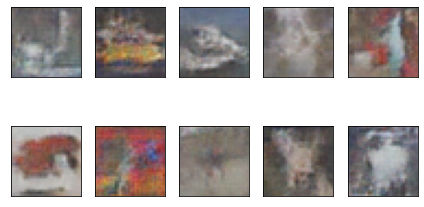

Time for epoch 311 is 26.85175585746765 sec
epoch = 312/450, d_loss=0.960, g_loss=0.941
Time for epoch 312 is 26.839457750320435 sec
epoch = 313/450, d_loss=1.249, g_loss=1.150
Time for epoch 313 is 26.754585027694702 sec
epoch = 314/450, d_loss=1.299, g_loss=1.158
Time for epoch 314 is 27.06728959083557 sec
epoch = 315/450, d_loss=0.910, g_loss=1.207
Time for epoch 315 is 27.05600118637085 sec
epoch = 316/450, d_loss=0.795, g_loss=1.029


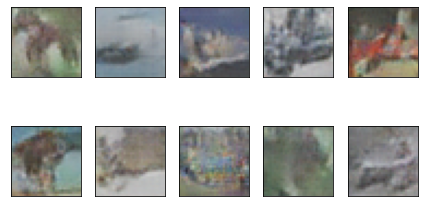

Time for epoch 316 is 26.657719135284424 sec
epoch = 317/450, d_loss=1.144, g_loss=1.161
Time for epoch 317 is 26.65838050842285 sec
epoch = 318/450, d_loss=1.229, g_loss=0.944
Time for epoch 318 is 26.59804105758667 sec
epoch = 319/450, d_loss=1.018, g_loss=1.306
Time for epoch 319 is 27.082189321517944 sec
epoch = 320/450, d_loss=1.262, g_loss=1.071
Time for epoch 320 is 26.294354677200317 sec
epoch = 321/450, d_loss=0.878, g_loss=1.114


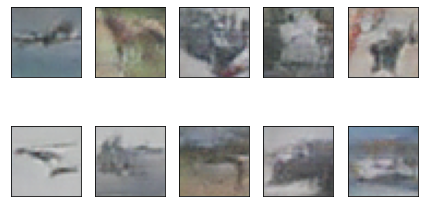

Time for epoch 321 is 26.75278401374817 sec
epoch = 322/450, d_loss=1.156, g_loss=0.967
Time for epoch 322 is 26.685737371444702 sec
epoch = 323/450, d_loss=0.763, g_loss=1.190
Time for epoch 323 is 27.118051290512085 sec
epoch = 324/450, d_loss=1.155, g_loss=1.064
Time for epoch 324 is 27.031547784805298 sec
epoch = 325/450, d_loss=1.000, g_loss=1.037
Time for epoch 325 is 26.925055980682373 sec
epoch = 326/450, d_loss=0.974, g_loss=1.211


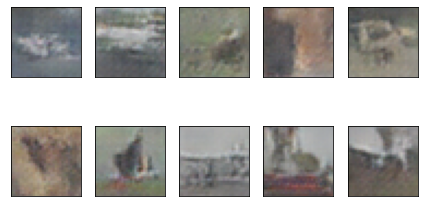

Time for epoch 326 is 27.673033237457275 sec
epoch = 327/450, d_loss=1.284, g_loss=1.229
Time for epoch 327 is 27.08818221092224 sec
epoch = 328/450, d_loss=0.818, g_loss=1.238
Time for epoch 328 is 26.976149320602417 sec
epoch = 329/450, d_loss=0.776, g_loss=1.208
Time for epoch 329 is 26.661988735198975 sec
epoch = 330/450, d_loss=0.940, g_loss=0.925
Time for epoch 330 is 26.912516832351685 sec
epoch = 331/450, d_loss=1.161, g_loss=1.058


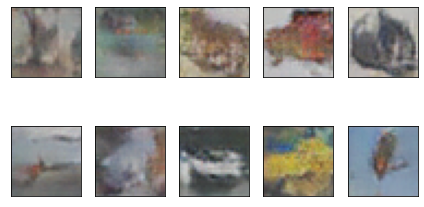

Time for epoch 331 is 27.50584864616394 sec
epoch = 332/450, d_loss=1.013, g_loss=1.506
Time for epoch 332 is 26.573160648345947 sec
epoch = 333/450, d_loss=1.102, g_loss=0.967
Time for epoch 333 is 26.75310778617859 sec
epoch = 334/450, d_loss=0.952, g_loss=1.181
Time for epoch 334 is 27.19431710243225 sec
epoch = 335/450, d_loss=0.833, g_loss=1.596
Time for epoch 335 is 27.142439126968384 sec
epoch = 336/450, d_loss=0.702, g_loss=1.471


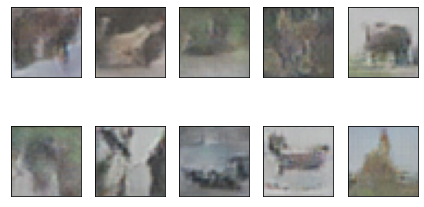

Time for epoch 336 is 27.293145418167114 sec
epoch = 337/450, d_loss=1.188, g_loss=0.879
Time for epoch 337 is 26.92642855644226 sec
epoch = 338/450, d_loss=0.954, g_loss=0.993
Time for epoch 338 is 27.53984522819519 sec
epoch = 339/450, d_loss=1.114, g_loss=1.231
Time for epoch 339 is 26.749739170074463 sec
epoch = 340/450, d_loss=0.932, g_loss=1.019
Time for epoch 340 is 26.772062301635742 sec
epoch = 341/450, d_loss=1.044, g_loss=1.224


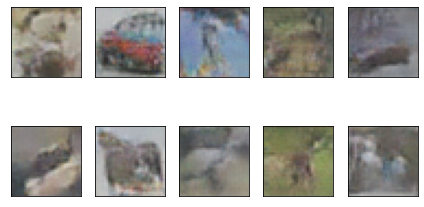

Time for epoch 341 is 27.562971591949463 sec
epoch = 342/450, d_loss=0.910, g_loss=1.188
Time for epoch 342 is 26.7886004447937 sec
epoch = 343/450, d_loss=0.951, g_loss=0.911
Time for epoch 343 is 26.29054617881775 sec
epoch = 344/450, d_loss=1.003, g_loss=1.096
Time for epoch 344 is 26.0023512840271 sec
epoch = 345/450, d_loss=0.901, g_loss=1.461
Time for epoch 345 is 26.43424367904663 sec
epoch = 346/450, d_loss=0.690, g_loss=1.487


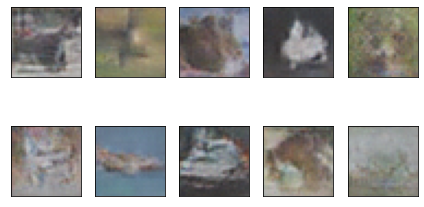

Time for epoch 346 is 26.77094578742981 sec
epoch = 347/450, d_loss=0.965, g_loss=1.260
Time for epoch 347 is 25.955413818359375 sec
epoch = 348/450, d_loss=0.982, g_loss=0.978
Time for epoch 348 is 25.749576807022095 sec
epoch = 349/450, d_loss=1.033, g_loss=1.352
Time for epoch 349 is 25.95042872428894 sec
epoch = 350/450, d_loss=1.002, g_loss=0.938
Time for epoch 350 is 26.468228578567505 sec
epoch = 351/450, d_loss=1.195, g_loss=1.225


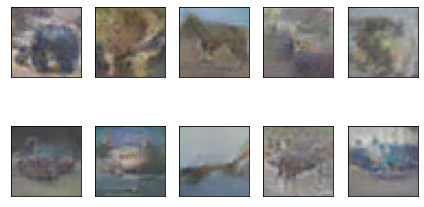

Time for epoch 351 is 25.774545192718506 sec
epoch = 352/450, d_loss=1.134, g_loss=1.007
Time for epoch 352 is 25.479546070098877 sec
epoch = 353/450, d_loss=0.867, g_loss=1.083
Time for epoch 353 is 25.356289863586426 sec
epoch = 354/450, d_loss=0.870, g_loss=1.433
Time for epoch 354 is 24.93453311920166 sec
epoch = 355/450, d_loss=1.018, g_loss=1.473
Time for epoch 355 is 24.922152757644653 sec
epoch = 356/450, d_loss=0.837, g_loss=1.615


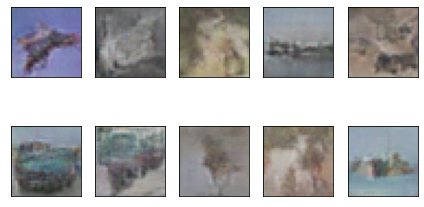

Time for epoch 356 is 25.63612675666809 sec
epoch = 357/450, d_loss=0.840, g_loss=1.480
Time for epoch 357 is 25.37583088874817 sec
epoch = 358/450, d_loss=0.871, g_loss=1.451
Time for epoch 358 is 25.527626037597656 sec
epoch = 359/450, d_loss=0.885, g_loss=1.064
Time for epoch 359 is 25.530527591705322 sec
epoch = 360/450, d_loss=0.958, g_loss=1.480
Time for epoch 360 is 24.980900764465332 sec
epoch = 361/450, d_loss=0.734, g_loss=1.268


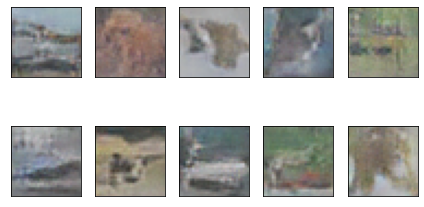

Time for epoch 361 is 25.60094690322876 sec
epoch = 362/450, d_loss=1.000, g_loss=1.370
Time for epoch 362 is 25.665317058563232 sec
epoch = 363/450, d_loss=0.951, g_loss=1.233
Time for epoch 363 is 25.29160714149475 sec
epoch = 364/450, d_loss=0.923, g_loss=1.164
Time for epoch 364 is 24.967247247695923 sec
epoch = 365/450, d_loss=0.846, g_loss=1.080
Time for epoch 365 is 24.79229974746704 sec
epoch = 366/450, d_loss=0.761, g_loss=1.183


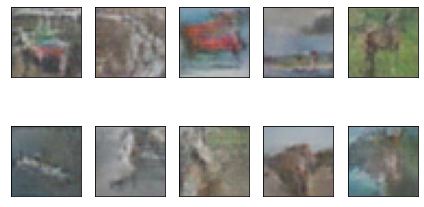

Time for epoch 366 is 25.31473708152771 sec
epoch = 367/450, d_loss=0.876, g_loss=1.639
Time for epoch 367 is 25.43334412574768 sec
epoch = 368/450, d_loss=1.031, g_loss=1.063
Time for epoch 368 is 24.89145040512085 sec
epoch = 369/450, d_loss=1.119, g_loss=1.457
Time for epoch 369 is 25.37161612510681 sec
epoch = 370/450, d_loss=0.715, g_loss=1.138
Time for epoch 370 is 25.40051770210266 sec
epoch = 371/450, d_loss=1.083, g_loss=1.172


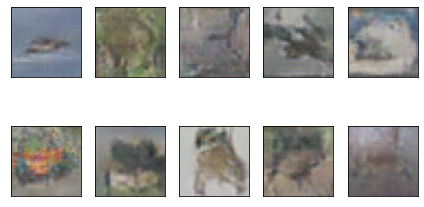

Time for epoch 371 is 25.323797702789307 sec
epoch = 372/450, d_loss=1.756, g_loss=1.064
Time for epoch 372 is 25.169850826263428 sec
epoch = 373/450, d_loss=0.823, g_loss=1.582
Time for epoch 373 is 24.93456244468689 sec
epoch = 374/450, d_loss=1.439, g_loss=1.327
Time for epoch 374 is 25.69550371170044 sec
epoch = 375/450, d_loss=1.020, g_loss=1.565
Time for epoch 375 is 24.99406671524048 sec
epoch = 376/450, d_loss=0.978, g_loss=1.413


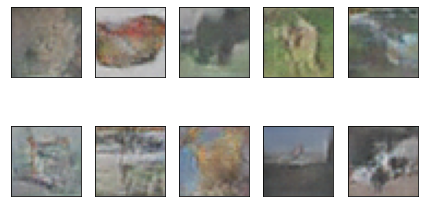

Time for epoch 376 is 25.028326511383057 sec
epoch = 377/450, d_loss=0.977, g_loss=1.211
Time for epoch 377 is 25.022069692611694 sec
epoch = 378/450, d_loss=1.065, g_loss=1.242
Time for epoch 378 is 24.987948179244995 sec
epoch = 379/450, d_loss=1.043, g_loss=1.357
Time for epoch 379 is 24.831555128097534 sec
epoch = 380/450, d_loss=0.906, g_loss=1.516
Time for epoch 380 is 24.690633058547974 sec
epoch = 381/450, d_loss=0.647, g_loss=2.017


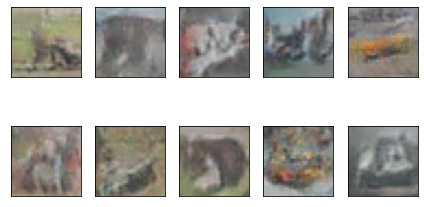

Time for epoch 381 is 25.235482215881348 sec
epoch = 382/450, d_loss=1.442, g_loss=1.120
Time for epoch 382 is 25.15431308746338 sec
epoch = 383/450, d_loss=1.260, g_loss=1.608
Time for epoch 383 is 25.358288049697876 sec
epoch = 384/450, d_loss=0.521, g_loss=1.607
Time for epoch 384 is 25.124345779418945 sec
epoch = 385/450, d_loss=0.590, g_loss=1.492
Time for epoch 385 is 25.345564126968384 sec
epoch = 386/450, d_loss=0.584, g_loss=1.314


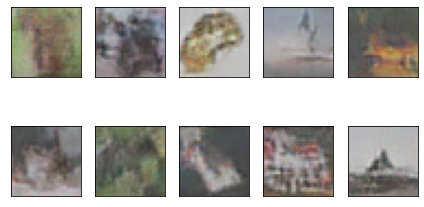

Time for epoch 386 is 25.748042106628418 sec
epoch = 387/450, d_loss=1.045, g_loss=1.408
Time for epoch 387 is 25.70177912712097 sec
epoch = 388/450, d_loss=1.059, g_loss=0.957
Time for epoch 388 is 24.938194274902344 sec
epoch = 389/450, d_loss=0.765, g_loss=1.230
Time for epoch 389 is 24.81430745124817 sec
epoch = 390/450, d_loss=0.787, g_loss=1.601
Time for epoch 390 is 24.78239679336548 sec
epoch = 391/450, d_loss=0.966, g_loss=1.578


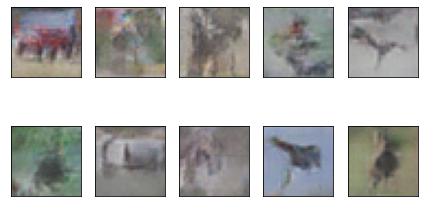

Time for epoch 391 is 25.570122003555298 sec
epoch = 392/450, d_loss=1.106, g_loss=1.379
Time for epoch 392 is 24.761462926864624 sec
epoch = 393/450, d_loss=1.089, g_loss=1.637
Time for epoch 393 is 25.09239673614502 sec
epoch = 394/450, d_loss=0.820, g_loss=1.607
Time for epoch 394 is 25.489278316497803 sec
epoch = 395/450, d_loss=0.395, g_loss=1.961
Time for epoch 395 is 25.029783725738525 sec
epoch = 396/450, d_loss=0.558, g_loss=1.822


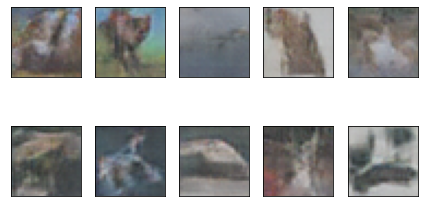

Time for epoch 396 is 25.480564832687378 sec
epoch = 397/450, d_loss=0.745, g_loss=1.723
Time for epoch 397 is 25.10828161239624 sec
epoch = 398/450, d_loss=0.867, g_loss=1.157
Time for epoch 398 is 24.939703941345215 sec
epoch = 399/450, d_loss=0.579, g_loss=1.264
Time for epoch 399 is 26.125344276428223 sec
epoch = 400/450, d_loss=0.952, g_loss=1.289
Time for epoch 400 is 25.296933889389038 sec
epoch = 401/450, d_loss=0.757, g_loss=1.382


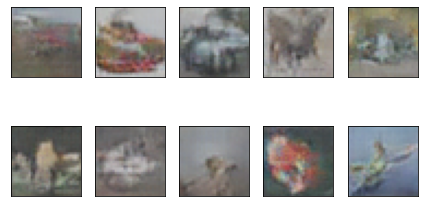

Time for epoch 401 is 25.00145387649536 sec
epoch = 402/450, d_loss=0.875, g_loss=1.466
Time for epoch 402 is 25.38744044303894 sec
epoch = 403/450, d_loss=1.220, g_loss=1.272
Time for epoch 403 is 25.218979597091675 sec
epoch = 404/450, d_loss=0.682, g_loss=1.181
Time for epoch 404 is 25.105544567108154 sec
epoch = 405/450, d_loss=0.704, g_loss=1.992
Time for epoch 405 is 24.9206326007843 sec
epoch = 406/450, d_loss=0.620, g_loss=1.407


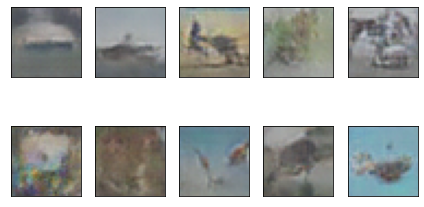

Time for epoch 406 is 25.726175785064697 sec
epoch = 407/450, d_loss=0.626, g_loss=1.586
Time for epoch 407 is 25.42812442779541 sec
epoch = 408/450, d_loss=0.725, g_loss=1.728
Time for epoch 408 is 24.831708908081055 sec
epoch = 409/450, d_loss=0.868, g_loss=1.265
Time for epoch 409 is 25.005822896957397 sec
epoch = 410/450, d_loss=0.799, g_loss=1.647
Time for epoch 410 is 24.942306995391846 sec
epoch = 411/450, d_loss=0.681, g_loss=1.671


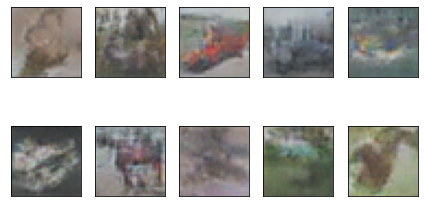

Time for epoch 411 is 25.552849054336548 sec
epoch = 412/450, d_loss=0.649, g_loss=1.669
Time for epoch 412 is 25.131305932998657 sec
epoch = 413/450, d_loss=0.746, g_loss=1.850
Time for epoch 413 is 24.812954902648926 sec
epoch = 414/450, d_loss=0.912, g_loss=1.654
Time for epoch 414 is 24.76915669441223 sec
epoch = 415/450, d_loss=0.838, g_loss=1.216
Time for epoch 415 is 24.460859537124634 sec
epoch = 416/450, d_loss=0.973, g_loss=1.272


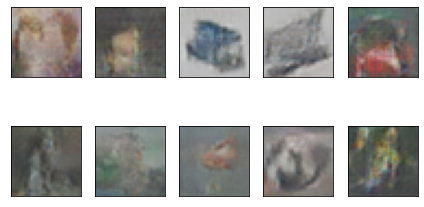

Time for epoch 416 is 25.567103385925293 sec
epoch = 417/450, d_loss=0.901, g_loss=1.825
Time for epoch 417 is 25.031981945037842 sec
epoch = 418/450, d_loss=1.328, g_loss=1.490
Time for epoch 418 is 25.143462657928467 sec
epoch = 419/450, d_loss=0.868, g_loss=1.345
Time for epoch 419 is 24.839460849761963 sec
epoch = 420/450, d_loss=0.836, g_loss=1.695
Time for epoch 420 is 24.867727279663086 sec
epoch = 421/450, d_loss=0.777, g_loss=2.396


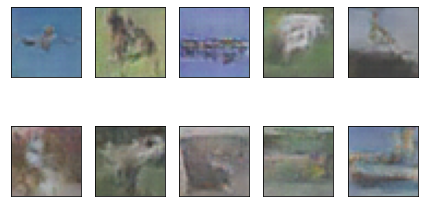

Time for epoch 421 is 25.639758825302124 sec
epoch = 422/450, d_loss=0.709, g_loss=1.962
Time for epoch 422 is 25.30876636505127 sec
epoch = 423/450, d_loss=0.764, g_loss=2.116
Time for epoch 423 is 24.898359537124634 sec
epoch = 424/450, d_loss=0.656, g_loss=1.338
Time for epoch 424 is 25.31590485572815 sec
epoch = 425/450, d_loss=0.506, g_loss=1.829
Time for epoch 425 is 24.619811534881592 sec
epoch = 426/450, d_loss=0.714, g_loss=1.453


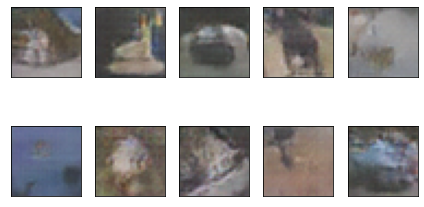

Time for epoch 426 is 25.46014404296875 sec
epoch = 427/450, d_loss=0.710, g_loss=1.996
Time for epoch 427 is 25.045515775680542 sec
epoch = 428/450, d_loss=0.944, g_loss=1.797
Time for epoch 428 is 25.0987491607666 sec
epoch = 429/450, d_loss=0.635, g_loss=1.274
Time for epoch 429 is 24.676898956298828 sec
epoch = 430/450, d_loss=1.172, g_loss=1.547
Time for epoch 430 is 24.93415403366089 sec
epoch = 431/450, d_loss=0.571, g_loss=2.162


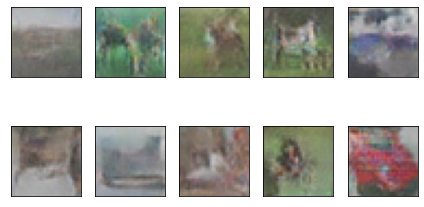

Time for epoch 431 is 25.49677324295044 sec
epoch = 432/450, d_loss=0.678, g_loss=1.822
Time for epoch 432 is 25.115232944488525 sec
epoch = 433/450, d_loss=0.522, g_loss=2.151
Time for epoch 433 is 24.54285955429077 sec
epoch = 434/450, d_loss=0.499, g_loss=1.591
Time for epoch 434 is 24.76623845100403 sec
epoch = 435/450, d_loss=0.396, g_loss=1.984
Time for epoch 435 is 24.89251184463501 sec
epoch = 436/450, d_loss=0.781, g_loss=1.558


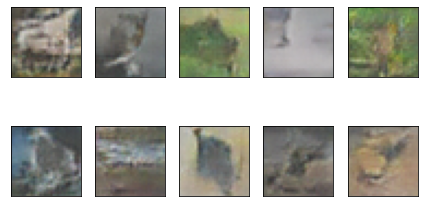

Time for epoch 436 is 25.970816135406494 sec
epoch = 437/450, d_loss=1.318, g_loss=2.132
Time for epoch 437 is 24.532194137573242 sec
epoch = 438/450, d_loss=0.543, g_loss=2.306
Time for epoch 438 is 24.852458477020264 sec
epoch = 439/450, d_loss=0.809, g_loss=1.622
Time for epoch 439 is 25.24593758583069 sec
epoch = 440/450, d_loss=0.608, g_loss=1.627
Time for epoch 440 is 25.037252187728882 sec
epoch = 441/450, d_loss=0.675, g_loss=2.148


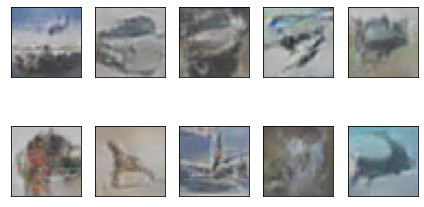

Time for epoch 441 is 25.07118010520935 sec
epoch = 442/450, d_loss=0.568, g_loss=1.852
Time for epoch 442 is 25.004966974258423 sec
epoch = 443/450, d_loss=1.019, g_loss=1.695
Time for epoch 443 is 24.95717740058899 sec
epoch = 444/450, d_loss=0.806, g_loss=1.781
Time for epoch 444 is 25.103636503219604 sec
epoch = 445/450, d_loss=0.623, g_loss=1.624
Time for epoch 445 is 24.782323598861694 sec
epoch = 446/450, d_loss=0.597, g_loss=1.665


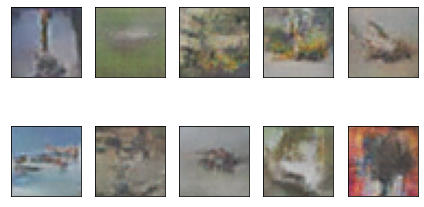

Time for epoch 446 is 25.778472423553467 sec
epoch = 447/450, d_loss=0.705, g_loss=1.936
Time for epoch 447 is 25.03527522087097 sec
epoch = 448/450, d_loss=0.584, g_loss=2.539
Time for epoch 448 is 25.606263399124146 sec
epoch = 449/450, d_loss=0.428, g_loss=1.759
Time for epoch 449 is 25.141414642333984 sec
epoch = 450/450, d_loss=0.718, g_loss=1.734
Time for epoch 450 is 25.02090859413147 sec


In [ ]:
# Step 1: Train a classifier C for CIFAR10 from scratch using (x_train, y_train)
# Step 2: Use x_train to train a GAN with latent dimension = 100 for 200 epochs
# Step 3: Generate 50,000 fake image samples
# Step 4: Use C to produce labels for all fake images
# Step 5: Train a classifier C' from scratch using the fake images and the predicted labels
# Step 6: Compare C and C' on (x_test, y_test)

#CIFAR10 data set contains 50k 32x32 images in the training set, and 10k images in the test set
num_imgs = 50000

# plot random generated fake images 
fig = plt.figure(figsize=(8,3))
for i in range(0, 10):
    plt.subplot(2, 5, 1 + i, xticks=[], yticks=[])
    plt.imshow(x_train[i])
plt.tight_layout()

# # reshape the training input and cast as float32
# print(f"x_train shape: {x_train.shape}, type: {type(x_train)}")

# normalize the training input
x_train = (np.float32(x_train)/255) - 0.5
x_train = tf.data.Dataset.from_tensor_slices(x_train).shuffle(num_imgs).batch(batch_size, drop_remainder=True)

# # get number of batches
# num_batch = num_imgs // batch_size

# define all the models

#If your kernel is died, you can set up the last finished epoch in train function.
if os.path.isfile(gan_model_path_json) and os.path.isfile(g_model_path_json) and os.path.isfile(d_model_path_json) and os.path.isfile(model_gan_path_weight) and os.path.isfile(model_g_path_weight) and os.path.isfile(model_d_path_weight) :
  print("load gan model")
  json_gan_file = open(gan_model_path_json, 'r')
  loaded_gan_model_json = json_gan_file.read()
  json_gan_file.close()

  gan = model_from_json(loaded_gan_model_json)
  gan.load_weights(model_gan_path_weight)
  gan.compile(keras.optimizers.Adam(learning_rate=3e-4, beta_1 = 0.8), loss='binary_crossentropy', metrics=['binary_accuracy'])
  
  json_g_file = open(g_model_path_json, 'r')
  loaded_g_model_json = json_g_file.read()
  json_g_file.close()

  generator = model_from_json(loaded_g_model_json)
  generator.load_weights(model_g_path_weight)

  json_d_file = open(d_model_path_json, 'r')
  loaded_d_model_json = json_d_file.read()
  json_d_file.close()

  discriminator = model_from_json(loaded_d_model_json)
  discriminator.load_weights(model_d_path_weight)
  opt = keras.optimizers.Adam(learning_rate=3e-5, beta_1 = 0.45)
  discriminator.compile(loss='binary_crossentropy',optimizer=opt,metrics=['binary_accuracy'])  

  gan= define_gan(generator,discriminator)
 
else:
  generator = define_generator()
  discriminator = define_discriminator()
  gan = define_gan(generator,discriminator)

#train the models
train(g_model=generator, d_model=discriminator, gan_model=gan, dataset=x_train, n_batch=batch_size, init_epochs=0)



In [ ]:
# Step 3: Generate 50,000 fake image samples
latent_dim = 100
num_imgs = 50000

# randomly generate 50000 training data set
random_noise = np.random.normal(size=(num_imgs,latent_dim))
random_img = generator.predict_on_batch(random_noise)
x_fake_train = random_img



# Step 4: Use c to produce labels for all fake images
# make test prediction
y_pred_test = model.predict_proba(x_fake_train)
y_pred_test_labels = np.argmax(y_pred_test, axis=1)
y_pred_test_max_probas = np.max(y_pred_test, axis=1)


#

# Step 5: Train a classifier c' from scratch using the fake images and the predicted labels
pred_label = y_pred_test_labels[:]
y_fake_train = pred_label
y_fake_train = np.reshape(y_fake_train,(50000,1))
x_fake_train  = [((x/255) - 0.5) for x in x_fake_train]
x_fake_train = np.array(x_fake_train)

# convert class labels to one-hot encoded, should have shape (?, NUM_CLASSES)
y_train2 = keras.utils.to_categorical(y_fake_train)

INIT_LR = 5e-3  # initial learning rate
BATCH_SIZE = 32
EPOCHS =200

model1 = make_model()  # define our model


model1.compile(
    loss='categorical_crossentropy',  # we train 10-way classification
    optimizer=keras.optimizers.adamax(lr=INIT_LR),  # for SGD
    metrics=['accuracy']  # report accuracy during training
)
# scheduler of learning rate (decay with epochs)
def lr_scheduler(epoch):
    return INIT_LR * 0.95 ** epoch

# callback for printing of actual learning rate used by optimizer
class LrHistory(keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs={}):
        print("Learning rate:", K.get_value(model1.optimizer.lr))


# we will save model checkpoints to continue training in case of kernel death
model_filename = 'fake_cifar.hdf5'
last_finished_epoch = None
print(f"x_test2: {len(x_test2)}")

# fit model
model1.fit(
    x_fake_train, y_train2,  # prepared data
    batch_size=BATCH_SIZE,
    epochs=EPOCHS,
    callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler), 
               LrHistory(), 
               TqdmProgressCallback(),
               ModelSaveCallback(model_filename)],
    #validation_data=(x_test2, y_test2),
    shuffle=True,
    verbose=0,
    initial_epoch=last_finished_epoch or 0
)

# save weights to file
model1.save_weights("fake_weights.h5")

# x_test for the original classifier c'
y__fake_pred_test = model1.predict_proba(x_test2)
y__fake_pred_test_classes = np.argmax(y__fake_pred_test, axis=1)
y__fake_pred_test_max_probas = np.max(y__fake_pred_test, axis=1)

# Step 6: Compare c and c' on (x_test, y_test)
print("c test accuracy:", accuracy_score(y_test[:], y_pred_test_classes))
print("c' test accuracy:", accuracy_score(y_test[:], y__fake_pred_test_classes))

x_test2: 10000
Learning rate: 0.005
Epoch 1/200


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  



Model saved in fake_cifar.hdf5
Learning rate: 0.00475
Epoch 2/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0045125
Epoch 3/200



Model saved in fake_cifar.hdf5
Learning rate: 0.004286875
Epoch 4/200



Model saved in fake_cifar.hdf5
Learning rate: 0.004072531
Epoch 5/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0038689047
Epoch 6/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0036754594
Epoch 7/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0034916864
Epoch 8/200



Model saved in fake_cifar.hdf5
Learning rate: 0.003317102
Epoch 9/200



Model saved in fake_cifar.hdf5
Learning rate: 0.003151247
Epoch 10/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0029936847
Epoch 11/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0028440005
Epoch 12/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0027018005
Epoch 13/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0025667103
Epoch 14/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0024383748
Epoch 15/200



Model saved in fake_cifar.hdf5
Learning rate: 0.002316456
Epoch 16/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0022006333
Epoch 17/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0020906017
Epoch 18/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0019860717
Epoch 19/200



Model saved in fake_cifar.hdf5
Learning rate: 0.001886768
Epoch 20/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0017924296
Epoch 21/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0017028081
Epoch 22/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0016176677
Epoch 23/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0015367843
Epoch 24/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0014599451
Epoch 25/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0013869478
Epoch 26/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0013176005
Epoch 27/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0012517205
Epoch 28/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0011891344
Epoch 29/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0011296778
Epoch 30/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0010731939
Epoch 31/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0010195341
Epoch 32/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00096855743
Epoch 33/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00092012953
Epoch 34/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00087412307
Epoch 35/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0008304169
Epoch 36/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00078889605
Epoch 37/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0007494513
Epoch 38/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0007119787
Epoch 39/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0006763798
Epoch 40/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0006425608
Epoch 41/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00061043276
Epoch 42/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0005799111
Epoch 43/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00055091555
Epoch 44/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00052336976
Epoch 45/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0004972013
Epoch 46/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00047234123
Epoch 47/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00044872417
Epoch 48/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00042628794
Epoch 49/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00040497354
Epoch 50/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00038472487
Epoch 51/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00036548864
Epoch 52/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0003472142
Epoch 53/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0003298535
Epoch 54/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00031336083
Epoch 55/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00029769278
Epoch 56/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00028280815
Epoch 57/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00026866773
Epoch 58/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00025523434
Epoch 59/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00024247263
Epoch 60/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00023034899
Epoch 61/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00021883154
Epoch 62/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00020788997
Epoch 63/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00019749546
Epoch 64/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0001876207
Epoch 65/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00017823966
Epoch 66/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00016932767
Epoch 67/200



Model saved in fake_cifar.hdf5
Learning rate: 0.0001608613
Epoch 68/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00015281823
Epoch 69/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00014517731
Epoch 70/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00013791845
Epoch 71/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00013102253
Epoch 72/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00012447141
Epoch 73/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00011824783
Epoch 74/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00011233544
Epoch 75/200



Model saved in fake_cifar.hdf5
Learning rate: 0.00010671867
Epoch 76/200



Model saved in fake_cifar.hdf5
Learning rate: 0.000101382735
Epoch 77/200



Model saved in fake_cifar.hdf5
Learning rate: 9.63136e-05
Epoch 78/200



Model saved in fake_cifar.hdf5
Learning rate: 9.149792e-05
Epoch 79/200



Model saved in fake_cifar.hdf5
Learning rate: 8.692302e-05
Epoch 80/200



Model saved in fake_cifar.hdf5
Learning rate: 8.257687e-05
Epoch 81/200



Model saved in fake_cifar.hdf5
Learning rate: 7.844803e-05
Epoch 82/200



Model saved in fake_cifar.hdf5
Learning rate: 7.4525626e-05
Epoch 83/200



Model saved in fake_cifar.hdf5
Learning rate: 7.0799346e-05
Epoch 84/200



Model saved in fake_cifar.hdf5
Learning rate: 6.725938e-05
Epoch 85/200



Model saved in fake_cifar.hdf5
Learning rate: 6.389641e-05
Epoch 86/200



Model saved in fake_cifar.hdf5
Learning rate: 6.070159e-05
Epoch 87/200



Model saved in fake_cifar.hdf5
Learning rate: 5.7666508e-05
Epoch 88/200



Model saved in fake_cifar.hdf5
Learning rate: 5.4783184e-05
Epoch 89/200



Model saved in fake_cifar.hdf5
Learning rate: 5.2044026e-05
Epoch 90/200



Model saved in fake_cifar.hdf5
Learning rate: 4.9441824e-05
Epoch 91/200



Model saved in fake_cifar.hdf5
Learning rate: 4.6969733e-05
Epoch 92/200



Model saved in fake_cifar.hdf5
Learning rate: 4.4621247e-05
Epoch 93/200



Model saved in fake_cifar.hdf5
Learning rate: 4.2390184e-05
Epoch 94/200



Model saved in fake_cifar.hdf5
Learning rate: 4.0270676e-05
Epoch 95/200



Model saved in fake_cifar.hdf5
Learning rate: 3.825714e-05
Epoch 96/200



Model saved in fake_cifar.hdf5
Learning rate: 3.6344285e-05
Epoch 97/200



Model saved in fake_cifar.hdf5
Learning rate: 3.452707e-05
Epoch 98/200



Model saved in fake_cifar.hdf5
Learning rate: 3.2800715e-05
Epoch 99/200



Model saved in fake_cifar.hdf5
Learning rate: 3.1160682e-05
Epoch 100/200



Model saved in fake_cifar.hdf5
Learning rate: 2.9602646e-05
Epoch 101/200



Model saved in fake_cifar.hdf5
Learning rate: 2.8122513e-05
Epoch 102/200



Model saved in fake_cifar.hdf5
Learning rate: 2.6716389e-05
Epoch 103/200



Model saved in fake_cifar.hdf5
Learning rate: 2.5380568e-05
Epoch 104/200



Model saved in fake_cifar.hdf5
Learning rate: 2.411154e-05
Epoch 105/200



Model saved in fake_cifar.hdf5
Learning rate: 2.2905962e-05
Epoch 106/200



Model saved in fake_cifar.hdf5
Learning rate: 2.1760665e-05
Epoch 107/200



Model saved in fake_cifar.hdf5
Learning rate: 2.0672633e-05
Epoch 108/200



Model saved in fake_cifar.hdf5
Learning rate: 1.9639001e-05
Epoch 109/200



Model saved in fake_cifar.hdf5
Learning rate: 1.865705e-05
Epoch 110/200



Model saved in fake_cifar.hdf5
Learning rate: 1.7724198e-05
Epoch 111/200



Model saved in fake_cifar.hdf5
Learning rate: 1.6837988e-05
Epoch 112/200



Model saved in fake_cifar.hdf5
Learning rate: 1.599609e-05
Epoch 113/200



Model saved in fake_cifar.hdf5
Learning rate: 1.5196284e-05
Epoch 114/200



Model saved in fake_cifar.hdf5
Learning rate: 1.4436469e-05
Epoch 115/200



Model saved in fake_cifar.hdf5
Learning rate: 1.3714646e-05
Epoch 116/200



Model saved in fake_cifar.hdf5
Learning rate: 1.3028914e-05
Epoch 117/200



Model saved in fake_cifar.hdf5
Learning rate: 1.2377468e-05
Epoch 118/200



Model saved in fake_cifar.hdf5
Learning rate: 1.1758595e-05
Epoch 119/200



Model saved in fake_cifar.hdf5
Learning rate: 1.1170665e-05
Epoch 120/200



Model saved in fake_cifar.hdf5
Learning rate: 1.06121315e-05
Epoch 121/200



Model saved in fake_cifar.hdf5
Learning rate: 1.0081525e-05
Epoch 122/200



Model saved in fake_cifar.hdf5
Learning rate: 9.577449e-06
Epoch 123/200



Model saved in fake_cifar.hdf5
Learning rate: 9.098577e-06
Epoch 124/200



Model saved in fake_cifar.hdf5
Learning rate: 8.643648e-06
Epoch 125/200



Model saved in fake_cifar.hdf5
Learning rate: 8.211466e-06
Epoch 126/200



Model saved in fake_cifar.hdf5
Learning rate: 7.8008925e-06
Epoch 127/200



Model saved in fake_cifar.hdf5
Learning rate: 7.4108475e-06
Epoch 128/200



Model saved in fake_cifar.hdf5
Learning rate: 7.0403053e-06
Epoch 129/200



Model saved in fake_cifar.hdf5
Learning rate: 6.68829e-06
Epoch 130/200



Model saved in fake_cifar.hdf5
Learning rate: 6.3538755e-06
Epoch 131/200



Model saved in fake_cifar.hdf5
Learning rate: 6.0361817e-06
Epoch 132/200



Model saved in fake_cifar.hdf5
Learning rate: 5.7343727e-06
Epoch 133/200



Model saved in fake_cifar.hdf5
Learning rate: 5.447654e-06
Epoch 134/200



Model saved in fake_cifar.hdf5
Learning rate: 5.1752713e-06
Epoch 135/200



Model saved in fake_cifar.hdf5
Learning rate: 4.916508e-06
Epoch 136/200



Model saved in fake_cifar.hdf5
Learning rate: 4.6706823e-06
Epoch 137/200



Model saved in fake_cifar.hdf5
Learning rate: 4.437148e-06
Epoch 138/200



Model saved in fake_cifar.hdf5
Learning rate: 4.2152906e-06
Epoch 139/200



Model saved in fake_cifar.hdf5
Learning rate: 4.004526e-06
Epoch 140/200



Model saved in fake_cifar.hdf5
Learning rate: 3.8043e-06
Epoch 141/200



Model saved in fake_cifar.hdf5
Learning rate: 3.6140848e-06
Epoch 142/200



Model saved in fake_cifar.hdf5
Learning rate: 3.4333807e-06
Epoch 143/200



Model saved in fake_cifar.hdf5
Learning rate: 3.2617115e-06
Epoch 144/200



Model saved in fake_cifar.hdf5
Learning rate: 3.098626e-06
Epoch 145/200



Model saved in fake_cifar.hdf5
Learning rate: 2.9436947e-06
Epoch 146/200



Model saved in fake_cifar.hdf5
Learning rate: 2.79651e-06
Epoch 147/200



Model saved in fake_cifar.hdf5
Learning rate: 2.6566845e-06
Epoch 148/200



Model saved in fake_cifar.hdf5
Learning rate: 2.5238503e-06
Epoch 149/200



Model saved in fake_cifar.hdf5
Learning rate: 2.3976577e-06
Epoch 150/200



Model saved in fake_cifar.hdf5
Learning rate: 2.277775e-06
Epoch 151/200



Model saved in fake_cifar.hdf5
Learning rate: 2.1638862e-06
Epoch 152/200



Model saved in fake_cifar.hdf5
Learning rate: 2.0556918e-06
Epoch 153/200



Model saved in fake_cifar.hdf5
Learning rate: 1.9529073e-06
Epoch 154/200



Model saved in fake_cifar.hdf5
Learning rate: 1.8552619e-06
Epoch 155/200



Model saved in fake_cifar.hdf5
Learning rate: 1.7624988e-06
Epoch 156/200



Model saved in fake_cifar.hdf5
Learning rate: 1.6743738e-06
Epoch 157/200



Model saved in fake_cifar.hdf5
Learning rate: 1.5906552e-06
Epoch 158/200



Model saved in fake_cifar.hdf5
Learning rate: 1.5111224e-06
Epoch 159/200



Model saved in fake_cifar.hdf5
Learning rate: 1.4355662e-06
Epoch 160/200



Model saved in fake_cifar.hdf5
Learning rate: 1.363788e-06
Epoch 161/200



Model saved in fake_cifar.hdf5
Learning rate: 1.2955985e-06
Epoch 162/200



Model saved in fake_cifar.hdf5
Learning rate: 1.2308186e-06
Epoch 163/200



Model saved in fake_cifar.hdf5
Learning rate: 1.1692777e-06
Epoch 164/200



Model saved in fake_cifar.hdf5
Learning rate: 1.1108139e-06
Epoch 165/200



Model saved in fake_cifar.hdf5
Learning rate: 1.0552732e-06
Epoch 166/200



Model saved in fake_cifar.hdf5
Learning rate: 1.0025095e-06
Epoch 167/200



Model saved in fake_cifar.hdf5
Learning rate: 9.5238397e-07
Epoch 168/200



Model saved in fake_cifar.hdf5
Learning rate: 9.047648e-07
Epoch 169/200



Model saved in fake_cifar.hdf5
Learning rate: 8.5952655e-07
Epoch 170/200



Model saved in fake_cifar.hdf5
Learning rate: 8.165502e-07
Epoch 171/200



Model saved in fake_cifar.hdf5
Learning rate: 7.757227e-07
Epoch 172/200



Model saved in fake_cifar.hdf5
Learning rate: 7.3693656e-07
Epoch 173/200



Model saved in fake_cifar.hdf5
Learning rate: 7.0008974e-07
Epoch 174/200



Model saved in fake_cifar.hdf5
Learning rate: 6.650853e-07
Epoch 175/200



Model saved in fake_cifar.hdf5
Learning rate: 6.3183097e-07
Epoch 176/200



Model saved in fake_cifar.hdf5
Learning rate: 6.0023945e-07
Epoch 177/200



Model saved in fake_cifar.hdf5
Learning rate: 5.702275e-07
Epoch 178/200



Model saved in fake_cifar.hdf5
Learning rate: 5.417161e-07
Epoch 179/200



Model saved in fake_cifar.hdf5
Learning rate: 5.146303e-07
Epoch 180/200



Model saved in fake_cifar.hdf5
Learning rate: 4.8889876e-07
Epoch 181/200



Model saved in fake_cifar.hdf5
Learning rate: 4.6445385e-07
Epoch 182/200



Model saved in fake_cifar.hdf5
Learning rate: 4.4123115e-07
Epoch 183/200



Model saved in fake_cifar.hdf5
Learning rate: 4.191696e-07
Epoch 184/200



Model saved in fake_cifar.hdf5
Learning rate: 3.982111e-07
Epoch 185/200



Model saved in fake_cifar.hdf5
Learning rate: 3.7830057e-07
Epoch 186/200



Model saved in fake_cifar.hdf5
Learning rate: 3.5938552e-07
Epoch 187/200



Model saved in fake_cifar.hdf5
Learning rate: 3.4141627e-07
Epoch 188/200



Model saved in fake_cifar.hdf5
Learning rate: 3.2434545e-07
Epoch 189/200



Model saved in fake_cifar.hdf5
Learning rate: 3.0812816e-07
Epoch 190/200



Model saved in fake_cifar.hdf5
Learning rate: 2.9272175e-07
Epoch 191/200



Model saved in fake_cifar.hdf5
Learning rate: 2.7808568e-07
Epoch 192/200



Model saved in fake_cifar.hdf5
Learning rate: 2.6418138e-07
Epoch 193/200



Model saved in fake_cifar.hdf5
Learning rate: 2.509723e-07
Epoch 194/200



Model saved in fake_cifar.hdf5
Learning rate: 2.384237e-07
Epoch 195/200



Model saved in fake_cifar.hdf5
Learning rate: 2.2650252e-07
Epoch 196/200



Model saved in fake_cifar.hdf5
Learning rate: 2.151774e-07
Epoch 197/200



Model saved in fake_cifar.hdf5
Learning rate: 2.0441853e-07
Epoch 198/200



Model saved in fake_cifar.hdf5
Learning rate: 1.941976e-07
Epoch 199/200



Model saved in fake_cifar.hdf5
Learning rate: 1.8448772e-07
Epoch 200/200



Model saved in fake_cifar.hdf5
c test accuracy: 0.7956
c' test accuracy: 0.1001


## **Part 5: Visualize Class Activiation Map**

Using the code described in 

https://github.com/fchollet/deep-learning-with-python-notebooks/blob/master/5.4-visualizing-what-convnets-learn.ipynb 

Implement the class activation map (CAM) to show the parts of the test images above that led your CNN to its final classification decision

In [ ]:
from keras.models import load_model

model = load_model(model_path)
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 32, 32, 16)        448       
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 32, 32, 16)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 32, 32, 32)        4640      
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 32, 32, 32)        0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 16, 16, 32)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 16, 16, 32)       

In [ ]:
from keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

# Show a horse image x_train[52].
plt.imshow(x_train[52])
plt.title('Original Image', fontsize=16)

# Import the libraries
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np
import cv2

# Pick a horse image x_train[52] to show the heatmap.
img = x_train[52]
print('Shape of the image:', np.shape(img))

# 'x' is a numpy array of shape (32, 32, 3)
x = image.img_to_array(img)

# A dimension was added to increse the "batch", the dimension of the array is now (1, 32, 32, 3)
x = np.expand_dims(x, axis=0)

# This is the "horse" entry in the prediction vector, 7 is the class of horse
horse = model.output[:, 7]

# This is the output feature map of the 'conv2d_16' layer,
# the last convolutional layer in our architecture
last_conv_layer = model.get_layer('conv2d_56')

# This is the gradient of the "horse" class with regard to
# the output feature map of 'conv2d_16'
grads = K.gradients(horse, last_conv_layer.output)[0]


# This is a vector of shape (64,), where each entry
# is the mean intensity of the gradient over a specific feature map channel
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# This function allows us to access the values of the quantities we just defined:
# 'pooled_grads' and the output feature map of 'conv2d_16', given a sample image.
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

# These are the values of these two quantities, as Numpy arrays,
# given our sample image of one horse
pooled_grads_value, conv_layer_output_value = iterate([x])

# We multiply each channel in the feature map array by "how important this channel is" with regard to the horse class
for i in range(10):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

# The channel-wise mean of the resulting feature map is our heatmap of class activation
heatmap = np.mean(conv_layer_output_value, axis= -1)

heatmap = np.abs(heatmap)
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.title('Heatmap(before resize)', fontsize=16)
plt.show()



# We resize the heatmap to have the same size as the original image
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# Convert the heatmap to RGB
heatmap = np.uint8(255 * heatmap)

# We apply the heatmap to the original image
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0.4 here is a heatmap intensity factor
#print(np.shape(heatmap),'after resize')
plt.imshow(heatmap)
plt.title('Heatmap(after resize)', fontsize=16)
plt.show()
superimposed_img = heatmap * 0.4 + img

superimposed_img = superimposed_img.astype(int)

# Save the image to disk
plt.imshow(superimposed_img)
plt.title('Original image + Heatmap', fontsize=16)
plt.show()


Using TensorFlow backend.


170500096/170498071 [==============================] - 6s 0us/step


NameError: ignored